## Acknowledgement

This notebook is based on the book **["Build a Large Language Model (From Scratch)"](https://www.manning.com/books/build-a-large-language-model-from-scratch)** by **Sebastian Raschka**, published by Manning Publications.

- [Book on Manning](https://www.manning.com/books/build-a-large-language-model-from-scratch)
- [GitHub Repository](https://github.com/rasbt/LLMs-from-scratch)

---

# **Coding Attention Mechanism**

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os
os.chdir('/content/drive/MyDrive/LLM from Scratch/chapter_3/')
print(os.getcwd())

/content/drive/MyDrive/LLM from Scratch/chapter_3


In [3]:
from IPython.display import Image, display
%matplotlib inline

Attention is an integral part of the LLM architecture. In this chapter, we will look into attention mechanism in isolation and in later chapters we will look into other parts of LLM surrounding self-attention mechanism.

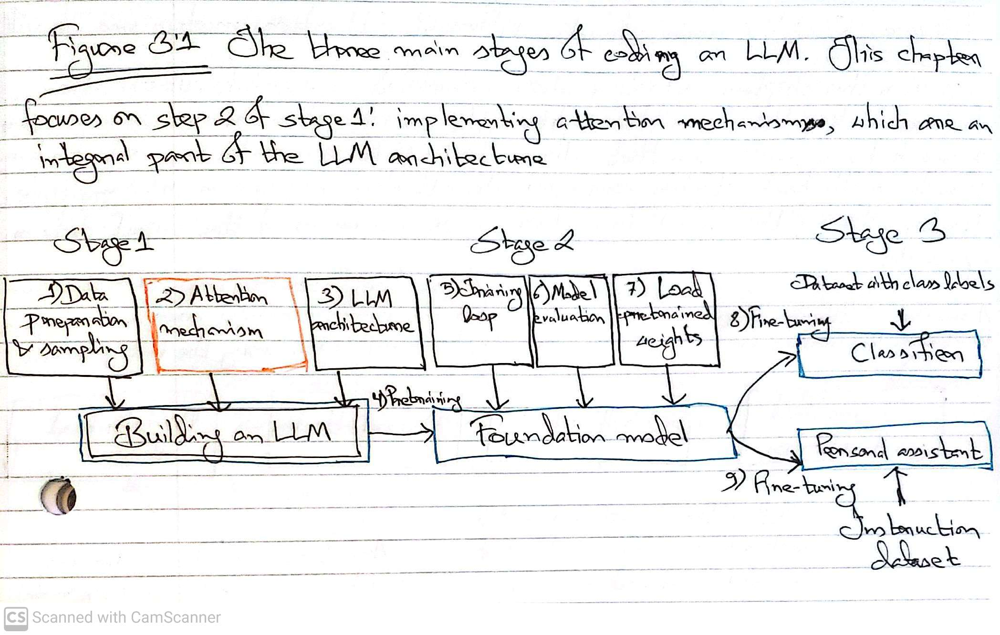

In [ ]:
display(Image(filename='3_1.jpg', width=800))

We will implement different types of attention mechanisms in this chapter. The target is to have a compact and efficient implementation of multi-head attention that can be plugged into the LLM architecture that will be coded in the next chapter.

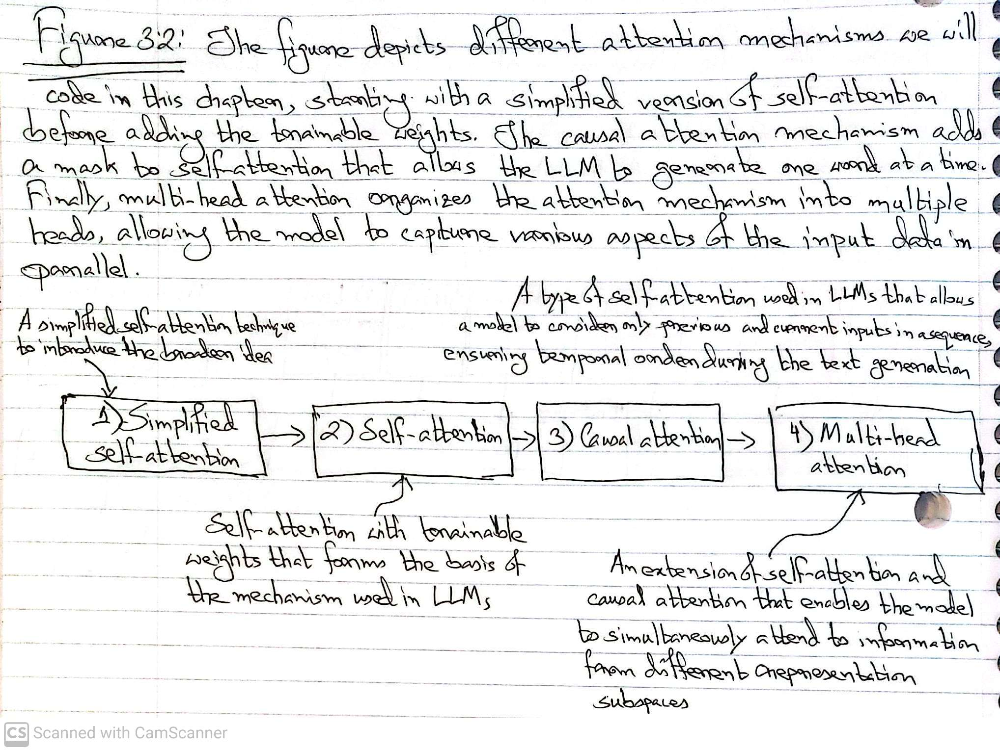

In [ ]:
display(Image(filename='3_2.jpg', width=800))

## **Problem with modeling long sequence**

Now, we will talk about the problems with pre-LLM architectures without attention mechanisms. If we want to develop a language translation model that translates from one language to another, we can't simply translate a text word by word as grammatical structures in the source and target language could be different.

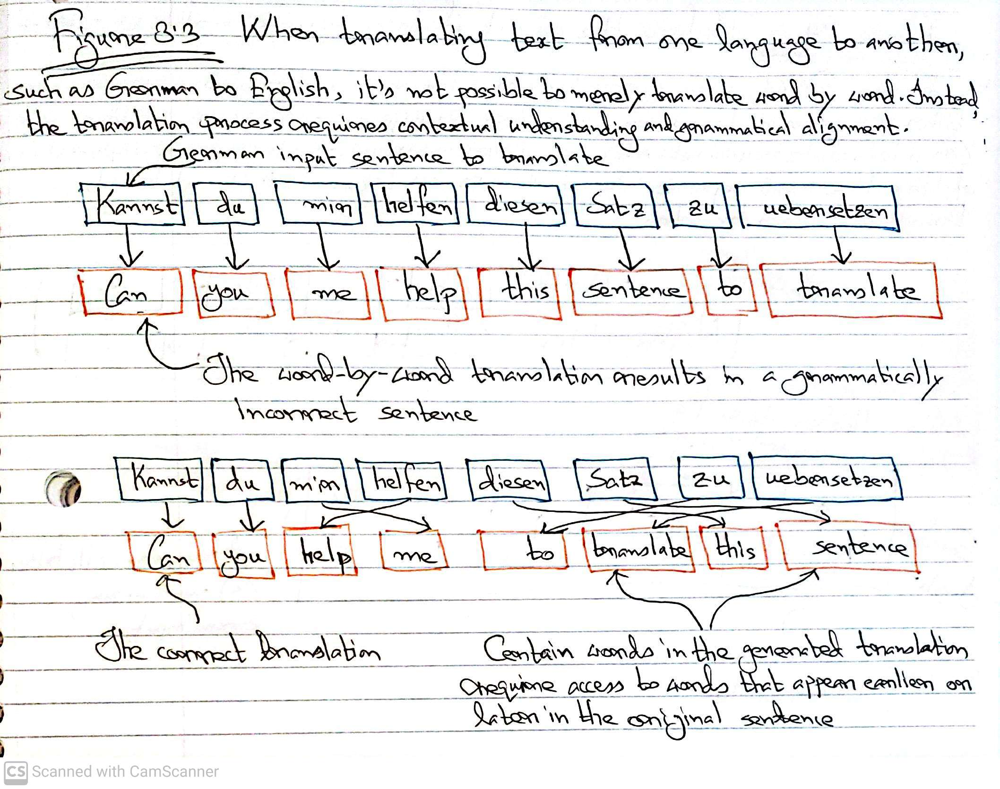

In [ ]:
display(Image(filename='3_3.jpg', width=800))

To tackle the challenge of language translation, a widely adopted approach involves using a deep neural network architecture composed of two main components: an encoder and a decoder. The encoder’s role is to read and understand the entire input text, transforming it into a rich, compressed representation that captures its essential meaning and context. Following this, the decoder takes this representation and generates the corresponding translated text in the target language, step by step.

Historically, before the breakthrough of transformer models, the most common framework for this encoder–decoder process was based on recurrent neural networks (RNNs). RNNs are specialized neural networks designed to handle sequential data by maintaining a form of memory: they use the output from the previous step as part of the input for the current step. This sequential processing enables them to model dependencies in text, such as word order and grammar, making them particularly suitable for tasks like translation.

In an encoder–decoder architecture based on recurrent neural networks (RNNs), the input sentence is processed sequentially by the encoder. At each step, the encoder reads one word (or token) and updates its internal hidden state—a set of numerical values stored within the hidden layers that acts as a dynamic memory capturing the information seen so far. This hidden state evolves as the encoder moves through the entire input sentence, gradually integrating the context, grammar, and semantic meaning of the words. By the time the encoder reaches the last word of the input, the final hidden state is intended to represent a comprehensive summary or embedding of the entire sentence’s meaning. This summarized information is then passed on to the decoder.

The decoder, which is also an RNN, uses this final hidden state from the encoder as its initial context to begin generating the translated output. It produces the translated sentence one word at a time in a sequential manner. At each generation step, the decoder updates its own hidden state, which serves as a memory of the partial translation generated so far and helps maintain coherence and grammatical correctness. This evolving hidden state contains the context needed for predicting the next word in the target language sequence, ensuring that each word is generated with awareness of both the source sentence’s meaning and the translation produced up to that point. This stepwise process continues until the decoder produces an end-of-sentence token, signaling the completion of the translation.

The decoder takes the final hidden state to start generating the translated sentence, onw word at a time. It also updates its hidden state at each step (as seen in the figure above Figure 3.4), which is designed to carry the required context needed for the next-word prediction.

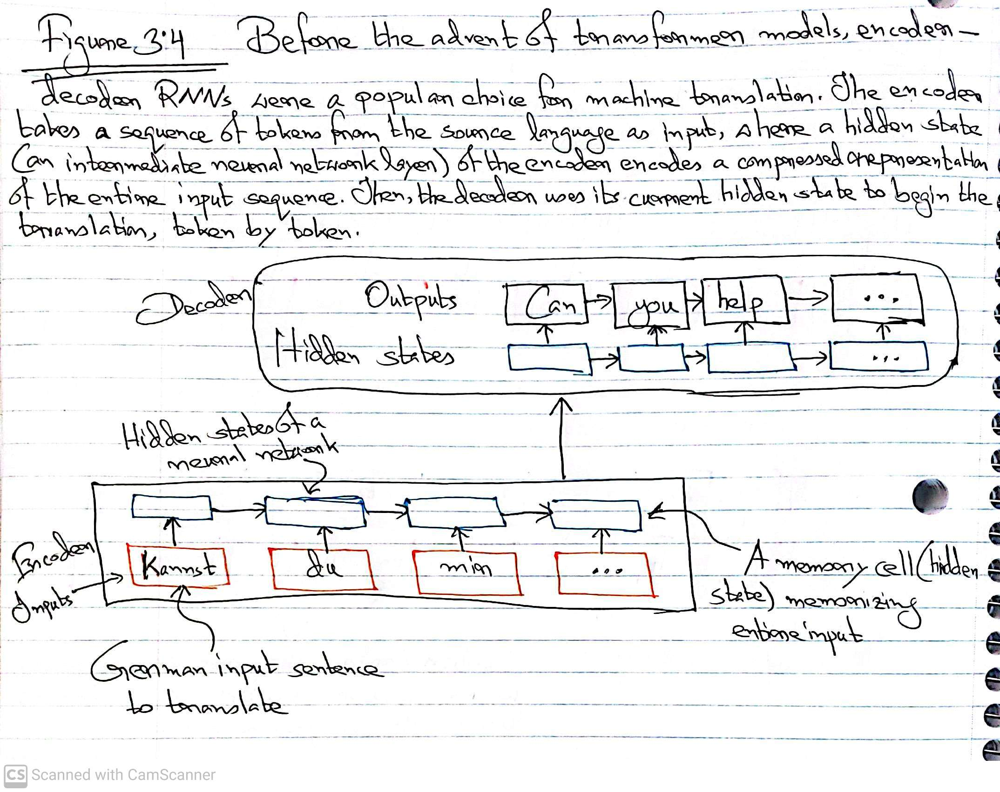

In [ ]:
display(Image(filename='3_4_2.jpg', width=800))

The main problem with encoder-decoder RNNs is that the RNN can't directly access earlier hidden states from the encoder during the decoding phase. It relies solely on the current hidden state encapsulating all relevant information. This can lead to a loss of context, this can happen for complex sentences where long distance dependencies might remain.

## **Capturing data dependencies with attention mechanisms**

RNNs work well for translating short sentences but not for longer texts as they don't have access to previous words in the input. One major headblock is that the RNN must remember the entire encoded input in a single hidden state before it is passed to the decoder. Look at the figure above (Figure 3.4).

To address this, researchers developed the Bahdanau attention mechanism for RNNs in 2014. This allowed decoder to selectively access different parts of the input sequence at each decoding step (Figure 3.5).

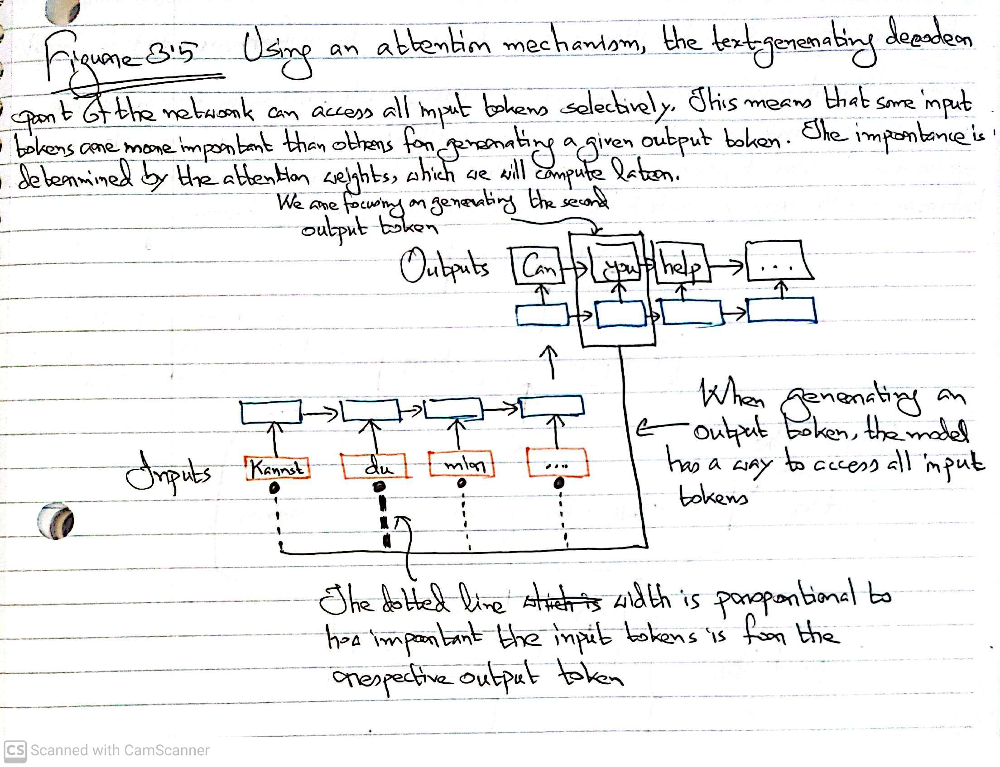

In [ ]:
display(Image(filename='3_5.jpg', width=800))

Within the next three years, researchers found that RNN architectures are not required for building deep neural networks and proposed transformer architecture including a self-attention mechanism inspired by the Bahdanau attention mechanism.

Self-attention mechanism allows each position of the input sequence to consider the relevancy of or "attend to", all other positions in the same sequence when computing the respresentation of a sequence.

In this chapter, we will focus on self-attention mechanism used GPT-like models used in the figure below. In the next chapter, remianing part of the LLM will be coded.

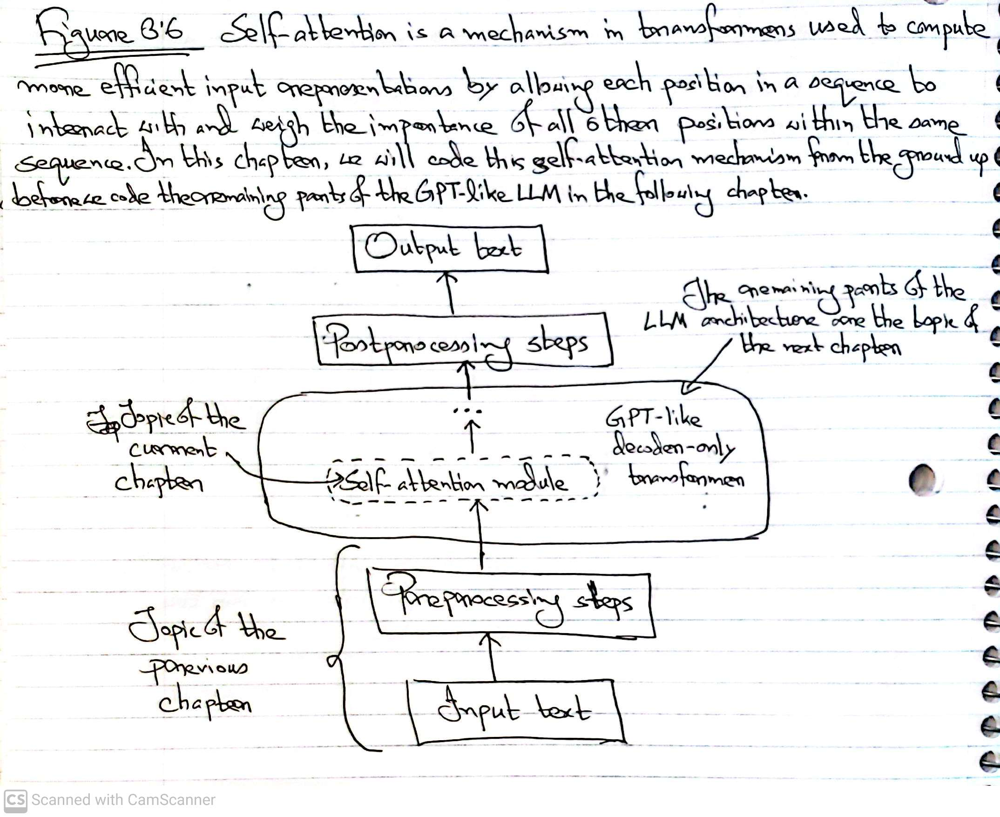

In [ ]:
display(Image(filename='3_6.jpg', width=800))

## Attending to different parts of the input with self-attention

🌟 **Unveiling Self-Attention: The Heart of Transformers** 🌟

Let’s dive into the inner workings of the self-attention mechanism and learn how to build it from the ground up. Self-attention is the powerhouse behind every large language model (LLM) built on the transformer architecture. While this topic might demand extra focus (no pun intended 😄), mastering it will equip us with one of the most advanced tools for understanding and implementing modern neural networks.

---

### The “Self” in Self-Attention 🤖
In self-attention, the term “self” highlights the mechanism’s ability to compute attention weights by relating different positions within the same input sequence. Instead of relying on external information, self-attention enables the model to:

- **Assess Internal Relationships:** It examines how each token (like words in a sentence or pixels in an image) relates to every other token in the same sequence.

- **Capture Dependencies:** This mechanism learns both short- and long-range dependencies, helping the model understand context and nuances even when relevant information is far apart in the sequence.

In contrast, traditional attention mechanisms focus on the relationships between two different sequences. For example, in sequence-to-sequence models used for translation, the attention mechanism aligns elements from the source sequence with those of the target sequence (as shown in Figure 3.5). Self-attention, however, operates within a single sequence, making it particularly suited for tasks where context is internal.

---

### Why Is Self-Attention So Powerful? 🚀
- **Dynamic Contextual Understanding:** It enables the model to weigh the importance of each token relative to others, allowing it to dynamically adapt to varying contexts.

- **Enhanced Parallelization:** Unlike recurrent architectures, self-attention processes all tokens simultaneously, which leads to significant improvements in training speed and efficiency.

- **Versatility Across Domains:** Whether applied to language, vision, or other domains, self-attention efficiently captures internal patterns and relationships, making it a universal building block for various AI applications.

---

From Simplified Concepts to Real-World Implementation 🛠️
Given its complexity, we'll start by exploring a simplified version of self-attention. This step-by-step approach will gradually lead us to implementing the full self-attention mechanism with trainable weights—the very engine that powers modern LLMs.

### A simple self-attention mechanism without trainable weights

For self-attention, the goal is to compute a context vector for each input element that van combine information from all other input elements.

In [ ]:
from IPython.display import display, HTML

# Read the SVG file
with open("attention-mechanism-diagram.svg", "r") as f:
    svg_content = f.read()

# Replace width and height (change values as needed)
# svg_resized = svg_content.replace('<svg width="700" height="800"', '<svg width="100" height="120"', 1)

# Display the modified SVG
# display(HTML(svg_resized))
display(HTML(svg_content))

Let's kick things off by implementing a simplified variant of self-attention—one that operates without trainable weights. This approach, summarized in the above figure 📊, is designed to introduce us to the foundational concepts of self-attention before diving into more advanced, weight-driven versions.

### 🔍 Breaking Down the Input Sequence

Imagine an input sequence, denoted as x, consisting of **T elements** labeled from x(1) to x(T). Typically, this sequence represents text (such as a sentence) that has already been converted into token embeddings. For example, consider the sentence:

> "Your journey starts with one step."

In this case, each element, like x(1) corresponding to the token "Your," is represented as a **d-dimensional embedding vector**. For clarity, the figure above (Figure 3.7) illustrates these vectors as three-dimensional embeddings, providing a clear, visual representation of how tokens are positioned in space 🌌.

### ✨ The Magic of Context Vectors

The heart of self-attention lies in its ability to generate **context vectors**, denoted as z(i) for each x(i). A context vector is essentially an **enriched embedding** that encapsulates not only the information of the token itself but also its relationships with all other tokens in the sequence.

To put it simply, let’s zoom in on the second element, x(2), which corresponds to the token "journey." In the above figure (Figure 3.7), you’ll notice the corresponding context vector, z(2), displayed at the bottom. This enhanced vector, z(2), integrates insights from every element in the sequence—from x(1) to x(T)—resulting in a more robust and informed representation.

### 💡 Why Context Vectors Matter

Context vectors are pivotal in self-attention because they allow the model to:

- **Integrate Information:** They combine data from all tokens, ensuring that each token's representation is enriched with its surrounding context.

- **Understand Relationships:** This integrated view is critical for LLMs (Large Language Models) as it helps them comprehend the relationships and relevance of words in a sentence.

- **Lay the Groundwork for Prediction:** Later on, we'll introduce trainable weights that refine these context vectors, optimizing them to generate the next token in a sequence 🔮.

### 🛠️ Next Steps: Simplified Implementation

Before adding trainable parameters, our immediate goal is to implement a basic self-attention mechanism that computes these context vectors step by step. This will give you a hands-on understanding of how self-attention aggregates information within an input sequence.

Now, consider the following input sentence, which has already been embedded into three-dimensional vectors (as discussed in Chapter 2). A smaller embedding dimension is chosen intentionally here for demonstration purpose.

Let’s dive in and see how these concepts come together in code! 🚀

In [4]:
import torch
inputs = torch.tensor(
    [[0.43, 0.15, 0.89], # Your (x^1)
    [0.55, 0.87, 0.66], # journey (x^2)
    [0.57, 0.85, 0.64], # starts (x^3)
    [0.22, 0.58, 0.33], # with (x^4)
    [0.77, 0.25, 0.10], # one (x^5)
    [0.05,0.80, 0.55]] # step (x^6)
  )

In [5]:
inputs.shape

torch.Size([6, 3])

#### **Step 1: Compute the attention scores w between the query x(2) and all other input elements as a dot product**

The first step in implementing self-attention involves computing the intermediate values, denoted as w, which are our **attention scores** 🚀. These scores play a pivotal role in determining how much each token in the input sequence should "attend" to every other token, essentially weighing the importance of the relationships between tokens.

As illustrated in **Figure 3.8** 📊, these attention scores are derived from the preceding inputs tensor.

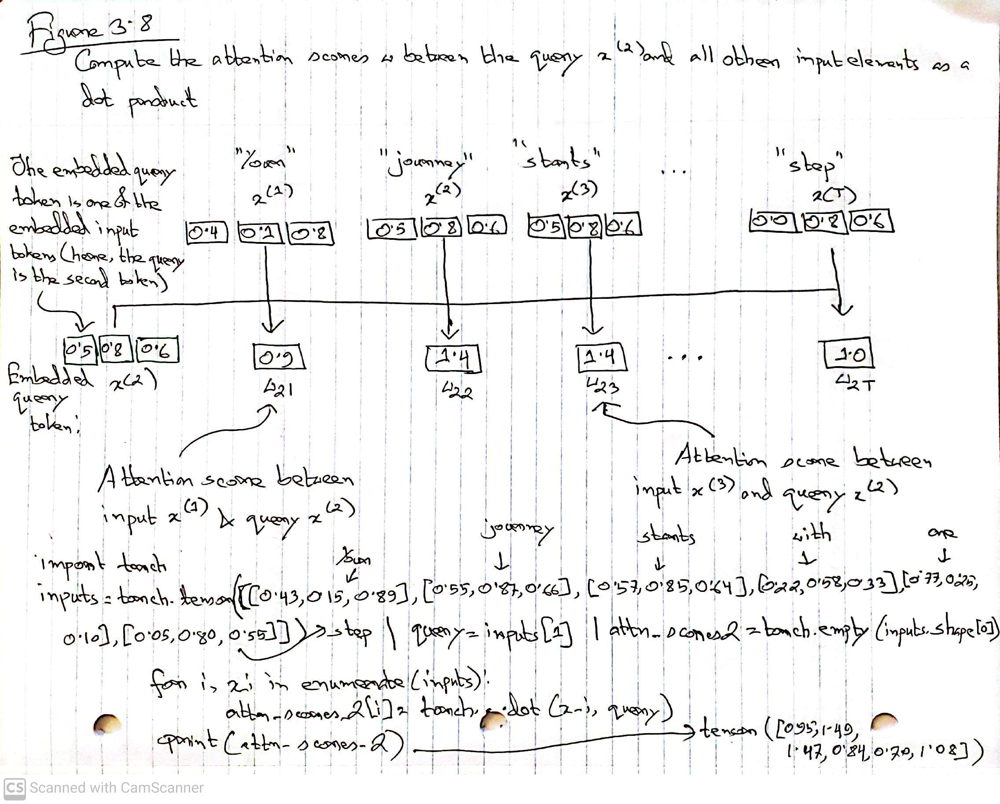

In [ ]:
display(Image(filename='Fig3.8.jpg', width=800))

Now, we calculate these scores by calculating the dot product of the query x(2) with all other input tokens.

In [6]:
query = inputs[1]
attn_scores_2 = torch.empty(inputs.shape[0])
for i, x_i in enumerate(inputs):
  attn_scores_2[i] = torch.dot(x_i, query)
print(attn_scores_2)

tensor([0.9544, 1.4950, 1.4754, 0.8434, 0.7070, 1.0865])


In [7]:
query[0]

tensor(0.5500)

In [8]:
query.shape

torch.Size([3])

**Note:** Dot product between two vectors tell us how close two vectors are. The dot product determines the extent to which each element in a sequence focuses on ar attends to any other element. The higher the dot product, the higher the similarity and attention score between the two elements.

#### **Step 2: Obtain the attention weights by normalizing the attention scores**

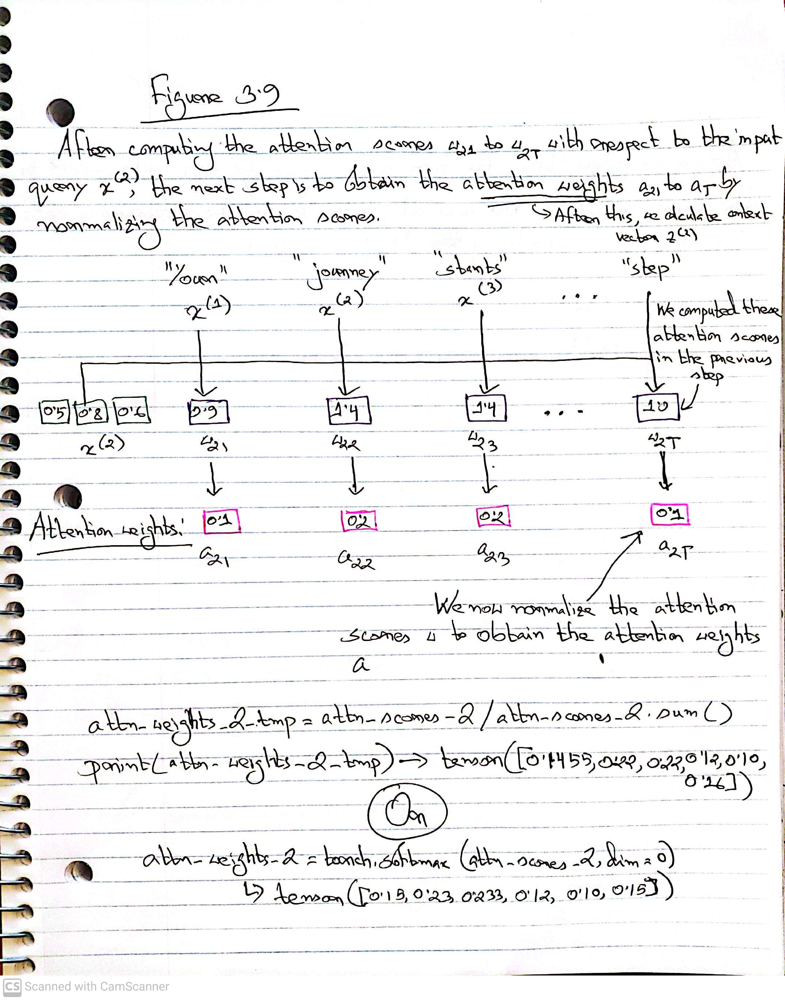

In [ ]:
display(Image(filename='Fig3.9.jpg', width=800))

In [ ]:
attn_weights_2_tmp = attn_scores_2 / attn_scores_2.sum()
print("Attention weights:", attn_weights_2_tmp)
print("Sum:", attn_weights_2_tmp.sum())

Attention weights: tensor([0.1455, 0.2278, 0.2249, 0.1285, 0.1077, 0.1656])
Sum: tensor(1.0000)


In practice, using the **softmax function** for normalization is the preferred approach 🚀. Softmax transforms raw attention scores into a probability distribution, ensuring that they sum up to 1. This not only makes the values more interpretable but also provides several benefits:

- **Manages Extreme Values:** Softmax effectively handles extreme scores by emphasizing the larger ones while suppressing the smaller ones. This prevents any single value from dominating the attention mechanism.

- **Favorable Gradient Properties:** The softmax function offers smoother gradients, which can be critical for stable and efficient training of deep neural networks.

- **Interpretable Weights:** By converting raw scores into probabilities, softmax allows the model to explicitly determine how much focus each token should receive relative to others.

In [ ]:
attn_scores_2.shape

torch.Size([6])

In [ ]:
def softmax_naive(x):
  return torch.exp(x) / torch.exp(x).sum(dim=0)

attn_weights_2_naive = softmax_naive(attn_scores_2)
print("Attention weights:", attn_weights_2_naive)
print("Sum:", attn_weights_2_naive.sum())

Attention weights: tensor([0.1385, 0.2379, 0.2333, 0.1240, 0.1082, 0.1581])
Sum: tensor(1.)


To avoid numerical instability problems, use Pytorch's implementation of softmax.

In [ ]:
attn_weights_2 = torch.softmax(attn_scores_2, dim=0)
print("Attention weights:", attn_weights_2)
print("Sum:", attn_weights_2.sum())

Attention weights: tensor([0.1385, 0.2379, 0.2333, 0.1240, 0.1082, 0.1581])
Sum: tensor(1.)


In [ ]:
attn_weights_2.shape

torch.Size([6])

#### **Step 3: Compute the context vector by calculating the weighted sum of all input vectors where weights are attention weights we computed in the previous steps**

Mow, we calculate the context vector z(2) by multiplying the input tokens x(i) with the corresponding attention weights and then summing the resulting vectors.

Here, context vector is z(2) as we are computiing context with respect to the second input. Attention weights are the weights we computed in the previous steps

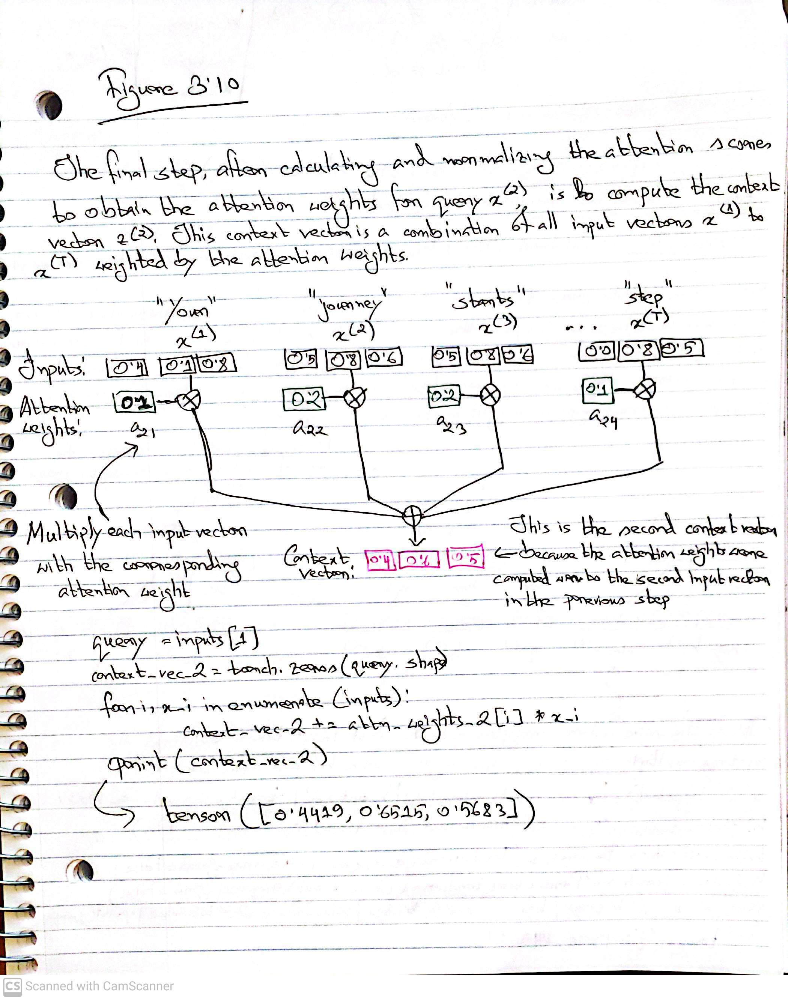

In [ ]:
display(Image(filename='Fig3.10.jpg', width=800))

In [ ]:
query = inputs[1]
context_vec_2 = torch.zeros(query.shape)
for i, x_i in enumerate(inputs):
  # print(x_i)
  context_vec_2 += attn_weights_2_tmp[i] * x_i
print(context_vec_2)

tensor([0.4355, 0.6451, 0.5680])


In [ ]:
inputs.shape

torch.Size([6, 3])

In [ ]:
torch.zeros(query.shape)

tensor([0., 0., 0.])

In [ ]:
inputs

tensor([[0.4300, 0.1500, 0.8900],
        [0.5500, 0.8700, 0.6600],
        [0.5700, 0.8500, 0.6400],
        [0.2200, 0.5800, 0.3300],
        [0.7700, 0.2500, 0.1000],
        [0.0500, 0.8000, 0.5500]])

In [ ]:
inputs.shape

torch.Size([6, 3])

## **Computing attention weights for all input tokens**

We have conputed attention weights for the second input, now we will try to calculate attention weights and context vectors for all inputs.

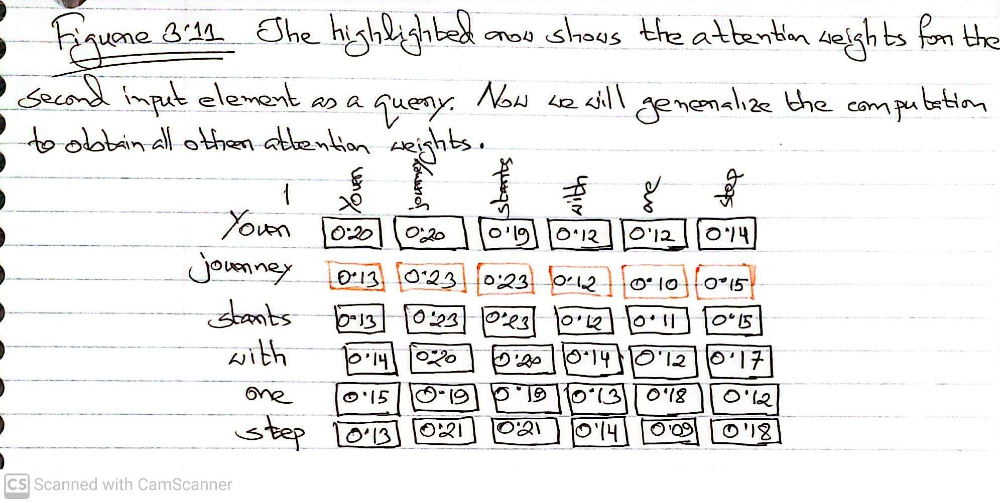

In [ ]:
display(Image(filename='3_11.jpg', width=800))

### **Step 1: attention scores w between all the queries**

In [ ]:
attn_scores = torch.empty(6, 6)
for i, x_i in enumerate(inputs):
  for j, x_j in enumerate(inputs):
    attn_scores[i, j] = torch.dot(x_i, x_j)
print(attn_scores)

tensor([[0.9995, 0.9544, 0.9422, 0.4753, 0.4576, 0.6310],
        [0.9544, 1.4950, 1.4754, 0.8434, 0.7070, 1.0865],
        [0.9422, 1.4754, 1.4570, 0.8296, 0.7154, 1.0605],
        [0.4753, 0.8434, 0.8296, 0.4937, 0.3474, 0.6565],
        [0.4576, 0.7070, 0.7154, 0.3474, 0.6654, 0.2935],
        [0.6310, 1.0865, 1.0605, 0.6565, 0.2935, 0.9450]])


Using matrix multiplication, we can also do the same thing.

In [ ]:
attn_scores = inputs @ inputs.T
print(attn_scores)

tensor([[0.9995, 0.9544, 0.9422, 0.4753, 0.4576, 0.6310],
        [0.9544, 1.4950, 1.4754, 0.8434, 0.7070, 1.0865],
        [0.9422, 1.4754, 1.4570, 0.8296, 0.7154, 1.0605],
        [0.4753, 0.8434, 0.8296, 0.4937, 0.3474, 0.6565],
        [0.4576, 0.7070, 0.7154, 0.3474, 0.6654, 0.2935],
        [0.6310, 1.0865, 1.0605, 0.6565, 0.2935, 0.9450]])


#### **Step 2: Obtain the attention weights by normalizing the attention scores**

#### Normalize each row so that the values in each row sum to 1

In [ ]:
attn_weights = torch.softmax(attn_scores, dim=-1) # normalize across the columns so that
# sum over a row is equal to 1
print(attn_weights)

tensor([[0.2098, 0.2006, 0.1981, 0.1242, 0.1220, 0.1452],
        [0.1385, 0.2379, 0.2333, 0.1240, 0.1082, 0.1581],
        [0.1390, 0.2369, 0.2326, 0.1242, 0.1108, 0.1565],
        [0.1435, 0.2074, 0.2046, 0.1462, 0.1263, 0.1720],
        [0.1526, 0.1958, 0.1975, 0.1367, 0.1879, 0.1295],
        [0.1385, 0.2184, 0.2128, 0.1420, 0.0988, 0.1896]])


#### **Step 3: Compute the context vector by calculating the weighted sum of all input vectors where weights are attention weights we computed in the previous steps**

In [ ]:
attn_weights @ inputs

tensor([[0.4421, 0.5931, 0.5790],
        [0.4419, 0.6515, 0.5683],
        [0.4431, 0.6496, 0.5671],
        [0.4304, 0.6298, 0.5510],
        [0.4671, 0.5910, 0.5266],
        [0.4177, 0.6503, 0.5645]])

### **Implementing self-attention with trainable weights**

Previously, our previous implementation of self attention was a simplified one without trainable weights. Our next step is to **implement the self-attention mechanism** used in the original transformer architecture—found in GPT models and many other state-of-the-art LLMs 🤖✨. This mechanism, known as **scaled dot-product attention**, refines the basic self-attention concept by incorporating **trainable weight matrices** that are learned during model training. Later, we will further improve this self-attention mechanism by adding a causal mask and multiple heads.

### What’s Happening Under the Hood? 🔍
At its core, the self-attention mechanism computes **context vectors** as weighted sums over input vectors. Each context vector enriches a specific input element by blending information from all other tokens in the sequence. Compared to the basic version we coded earlier, this advanced version introduces a couple of key enhancements:

- **Trainable Weight Matrices:**
These matrices are updated during training, allowing the attention module to learn to generate "good" context vectors. In other words, they help the model fine-tune how it weighs and aggregates input features so that the resulting context vectors capture the underlying meaning and relationships effectively.

- **Slight Modifications to the Basic Mechanism:**
Although the overall concept remains the same—computing weighted sums over input embeddings—the integration of trainable weights provides the necessary flexibility for the model to optimize its internal representations during learning.

### Why Are These Enhancements Important? 🚀
- **Adaptive Learning:**
The introduction of trainable weights enables the model to adjust its attention patterns dynamically based on the training data, leading to better performance in downstream tasks.

- **Improved Contextual Understanding:**
By producing enriched context vectors, the model can better capture semantic relationships between tokens, which is essential for tasks like language generation and comprehension.

**Foundation for LLM Training:**
While we'll dive deeper into training LLMs in Chapter 5, understanding this mechanism is critical as it forms the backbone of how these models process and generate language.

### Our Plan of Action 📋
We will tackle the self-attention mechanism in two major steps:

1. **Step-by-Step Implementation:**
We’ll start by coding the self-attention mechanism incrementally.

2. **Encapsulation into a Python Class:**
After understanding the step-by-step process, we'll organize the code into a compact Python class.

This self-attention mechanism is also called **scaled dot-product attention.**

 We want to compute context vectors as weighted sums over the input vectors specific to a certain input element.

Use three more trainable weight matrices Wq, Wk, and Wv which are used to project the embedded input tokens, x(i), into query, key, and value vectors, respectively.

### **Step 1: Calculate queries, keys, values**

In self-attention, we transform each input token into three distinct vectors: queries, keys, and values. These components work together to determine how much attention each token should pay to every other token in the sequence. Let’s break down what each one represents and why they are crucial:

- ### Queries (🎯):
The query vector represents what a given token is looking for in the rest of the sequence. Think of it as a “search request” that asks, "Which other tokens have information relevant to me?"

- ### Keys (🔑):
The key vector acts as an identifier or label for each token. It’s like an “index card” that holds information about what the token can offer. When a query is issued, it is compared against these keys to gauge similarity or relevance.

- ### Values (📦):
The value vector contains the actual information that will be aggregated. After determining which tokens are most relevant (using the similarity between queries and keys), the model uses the corresponding values to build a richer, context-aware representation.

### How They Work Together
1. **Similarity Calculation:**
Each query is compared with all keys using a dot product to measure their similarity. This step is like matching a search query with relevant items in a database 🔍.

2. **Scaling and Normalization:**
The resulting scores are scaled and passed through a softmax function. This normalization turns them into a probability distribution, indicating the importance (or weight) of each token relative to the query.

3. **Context Aggregation:**
Finally, these weights are applied to the value vectors. The result is a weighted sum that forms the context vector for that specific token. This enriched context vector encapsulates information from the entire sequence, tailored to what the token "needs" to know.

### Why Are They Important? 🌟
- **Decoupling Roles:**
By splitting the process into queries, keys, and values, the model can separately learn how to ask questions (queries), how to represent data (keys), and what the actual data is (values). This separation allows for a more flexible and powerful mechanism to capture relationships.

- **Enhanced Contextual Understanding:**
These components enable each token to gather contextual information from others efficiently. The model learns which parts of the sequence are most relevant for understanding each token, leading to improved performance in tasks like language modeling and translation.

- **Efficient Computation:**
The dot-product attention mechanism is highly parallelizable and efficient, making it suitable for large-scale models like GPT and other transformers.

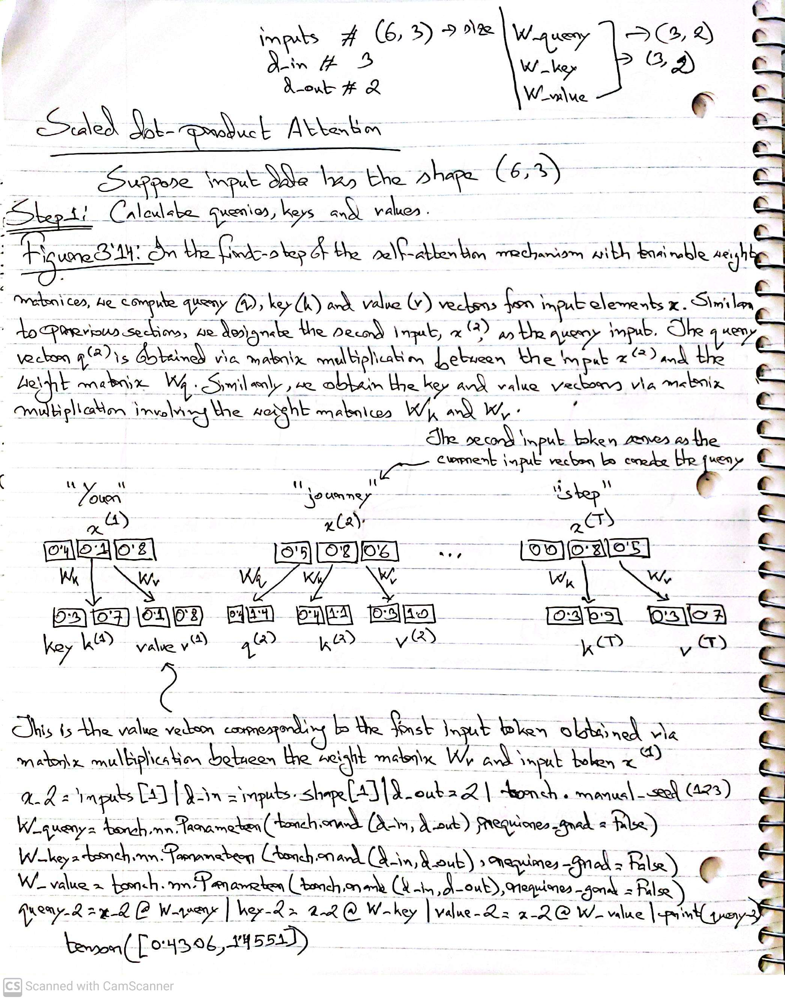

In [ ]:
display(Image(filename='Fig3.14.jpg', width=800))

Start by computing only one context vector z(2) which we can modify later to calculate all context vectors.

In [ ]:
x_2 = inputs[1]
d_in = inputs.shape[1]
d_out = 2

In [ ]:
x_2.shape

torch.Size([3])

In [ ]:
d_in

3

In [ ]:
inputs.shape

torch.Size([6, 3])

Initialize the three weight matrices.

In [ ]:
torch.manual_seed(123)
W_query = torch.nn.Parameter(torch.rand(d_in, d_out), requires_grad=False) # requires_grad=False as we are not training now
W_key = torch.nn.Parameter(torch.rand(d_in, d_out), requires_grad=False)
W_value = torch.nn.Parameter(torch.rand(d_in, d_out), requires_grad=False)

Compute the query, key and value vectors by multiplying second input element with the corresponding random weight matrices we just initialized.

In [ ]:
query_2 = x_2 @ W_query # it's a two-dimensional vector
key_2 = x_2 @ W_key
value_2 = x_2 @ W_value

In [ ]:
print(query_2)

tensor([0.4306, 1.4551])


In [ ]:
query_2.shape

torch.Size([2])

In [ ]:
key_2.shape

torch.Size([2])

### **Note: How does x_2 @ W_query work with these shapes?**

Given:
- `x_2` shape: `[3]` (a 1D tensor with 3 elements)

- `W_query` shape: `[3, 2]` (a 2D tensor, 3 rows and 2 columns)

- `@` operator: matrix multiplication (also called the dot product)


- `x_2` is a vector of length 3.

- `W_query` is a matrix with 3 rows and 2 columns.


When you multiply a 1D vector of length 3 with a 2D matrix of shape `[3, 2]` using `@`, PyTorch treats the vector as a row vector (shape `[1, 3]`) and performs matrix multiplication:

    (1×3)×(3×2)=(1×2)

So the output is a vector with length 2.

Even though our immediate goal is to compute just one context vector, z(2), for the token at position 2, we still need the key and value vectors for all input elements 🔑📦. This is because the attention mechanism computes attention weights by comparing the query q(2) (which represents what token 2 is looking for) against the keys of every token in the input sequence. These weights determine how much influence each token's value has on the resulting context vector. In other words, even a single enriched context vector, z(2), is constructed by considering the entire sequence, ensuring that the model captures a holistic view of the context. This comprehensive approach is what makes self-attention such a powerful tool in transformer-based models! 🚀✨

Now, we can obtain all keys and values.

In [ ]:
keys = inputs @ W_key
values = inputs @ W_value
print("keys.shape:", keys.shape)
print("values.shape:", values.shape)

keys.shape: torch.Size([6, 2])
values.shape: torch.Size([6, 2])


In [ ]:
inputs.shape

torch.Size([6, 3])

### **Step 2: Compute Attention Scores using dot product**

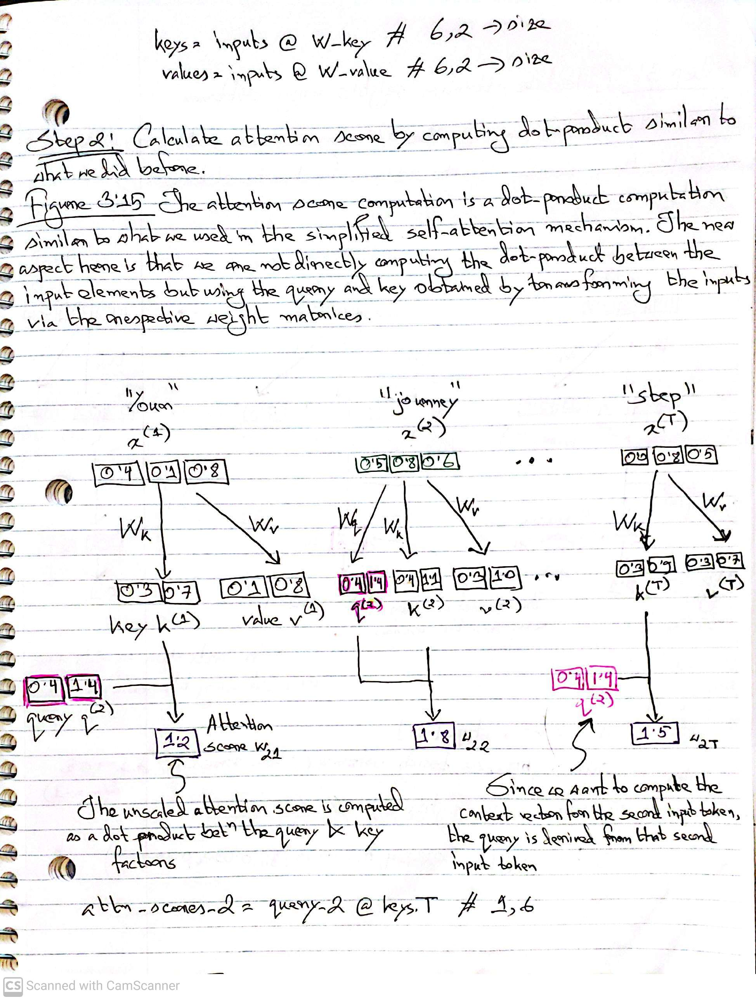

In [ ]:
display(Image(filename='Fig3.15.jpg', width=800))

In [ ]:
keys_2 = keys[1]
attn_scores_2 = query_2.dot(keys_2) # We have two 1D tensors of length 2. When we take dot product, we get a single value
print(attn_scores_2)

tensor(1.8524)


In [ ]:
query_2.shape

torch.Size([2])

In [ ]:
keys_2.shape

torch.Size([2])

Generalize to all attention scores.

In [ ]:
attn_scores_2 = query_2 @ keys.T # (1, 2) x (2, 6) = (1, 6)
print(attn_scores_2)

tensor([1.2705, 1.8524, 1.8111, 1.0795, 0.5577, 1.5440])


### **Step 3: Calculate attnetion weights using softmax**

Now, our next objective is to transform raw **attention scores** into refined attention weights—a process vividly illustrated in **Figure 3.16** 📊. This transformation occurs in two main steps: scaling the attention scores and then applying the softmax function. Let’s break it down:

1. **Scaling the Scores ⚖️:**
To begin, we scale the attention scores by dividing them by the square root of the embedding dimension of the keys. This step is crucial because it normalizes the scores, preventing them from growing too large and ensuring that the gradients remain stable during training. Mathematically, dividing by the square root is equivalent to raising the embedding dimension to the power of 0.5 (🧮). This normalization step ensures that the dot-product values are at a manageable scale, which is essential for the next step.

2. **Applying Softmax 🔥:**
Once the scores are scaled, we feed them into the softmax function. The softmax function converts these normalized scores into a probability distribution over the input tokens. This means that each attention weight reflects the relative importance of its corresponding token, with all weights summing to 1. In essence, softmax highlights the most relevant parts of the input for the current query.

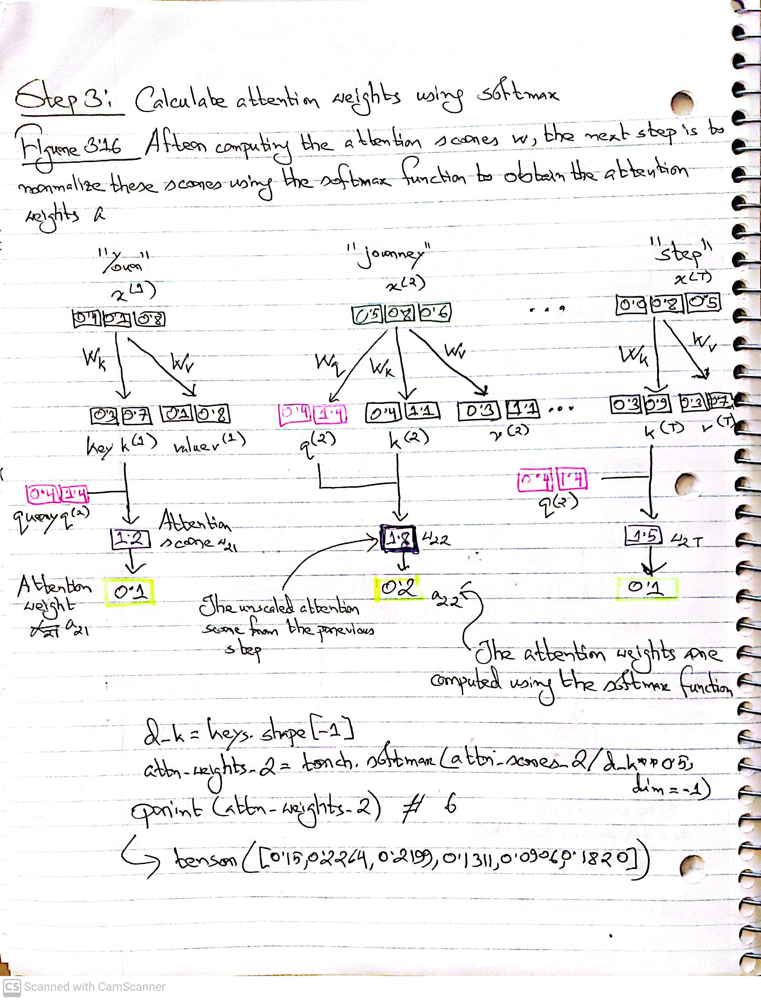

In [ ]:
display(Image(filename='Fig3.16.jpg', width=800))

In [ ]:
d_k = keys.shape[-1]
attn_weights_2 = torch.softmax(attn_scores_2 / d_k**0.5, dim=-1)
print(attn_weights_2)

tensor([0.1500, 0.2264, 0.2199, 0.1311, 0.0906, 0.1820])


In [ ]:
attn_weights_2.shape

torch.Size([6])

### **Step 4: Compute context vectors by multiplying each value vector with its respective attention weight and then summing them to obtain the context vector**

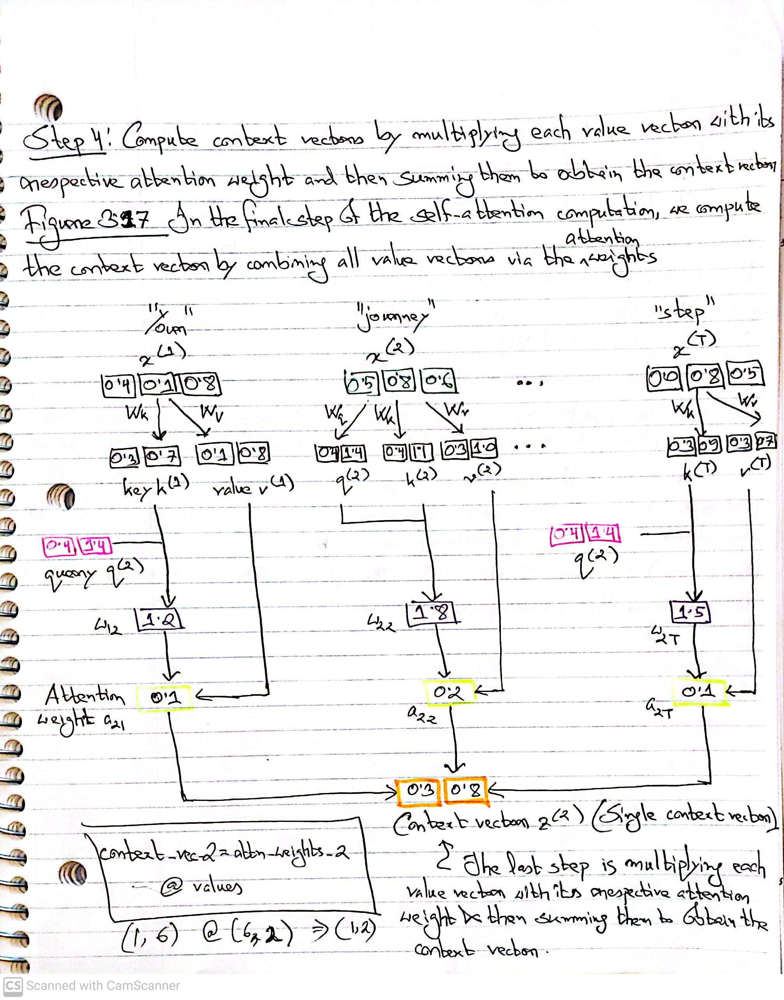

In [ ]:
display(Image(filename='Fig3.17.jpg', width=800))

In [ ]:
context_vec_2 = attn_weights_2 @ values # (1, 6) @ (6, 2) => (1, 2)
print(context_vec_2)

tensor([0.3061, 0.8210])


This is the value for a single context vector z(2).

- **Query (🔍):**
A query is like the search term you type into a database. It represents the current item—say, a word or token in a sentence—that the model is trying to understand. The query actively probes the entire input sequence, asking, "Which parts of the data are most relevant to me?" It sets the focus, guiding the model to where it should pay attention.

- **Key (🗝️):**
Think of a key as the index or identifier in a database. Every item in the input sequence comes with its own key, much like each record in a database has a unique key that helps in searching and sorting. These keys are used to match against the query. When the model processes the query, it looks through all these keys to find the best matches, just as a database would quickly locate records based on their keys.

- **Value (📦):**
The value is akin to the actual content stored in a database under a given key. It represents the rich information or representation of each input item. After the model identifies the most relevant keys based on the query, it retrieves the corresponding values. This process aggregates all the necessary details to form a complete, context-enriched understanding of the input.

In summary, queries, keys, and values work together harmoniously like a finely tuned search system:

- **Query (🔍):** What you're searching for—your current point of focus.

- **Key (🗝️):** The labels or indexes that help locate the relevant information.

- **Value (📦):** The actual content that is retrieved to build a comprehensive context.

### **A compact self-attention Python class**

In [ ]:
inputs = torch.tensor(
    [[0.43, 0.15, 0.89], # Your (x^1)
    [0.55, 0.87, 0.66], # journey (x^2)
    [0.57, 0.85, 0.64], # starts (x^3)
    [0.22, 0.58, 0.33], # with (x^4)
    [0.77, 0.25, 0.10], # one (x^5)
    [0.05,0.80, 0.55]] # step (x^6)
  )

In [ ]:
d_in = inputs.shape[1]
d_out = 2

In [ ]:
d_in

3

In [ ]:
import torch.nn as nn
class SelfAttention_v1(nn.Module):
  def __init__(self, d_in, d_out):
    super().__init__()
    self.W_query = nn.Parameter(torch.rand(d_in, d_out))
    self.W_key = nn.Parameter(torch.rand(d_in, d_out))
    self.W_value = nn.Parameter(torch.rand(d_in, d_out))

  def forward(self, x):
    keys = x @ self.W_key
    queries = x @ self.W_query
    values = x @ self.W_value
    attn_scores = queries @ keys.T
    attn_weights = torch.softmax(attn_scores/keys.shape[-1]**0.5, dim=-1)
    context_vec = attn_weights @ values
    return context_vec

Let's use this class now.

In [ ]:
torch.manual_seed(123)
sa_v1 = SelfAttention_v1(d_in, d_out)
print(sa_v1(inputs)) # Notice that we don't have to call forward method explicitly

tensor([[0.2996, 0.8053],
        [0.3061, 0.8210],
        [0.3058, 0.8203],
        [0.2948, 0.7939],
        [0.2927, 0.7891],
        [0.2990, 0.8040]], grad_fn=<MmBackward0>)


We can verify that the results are the same even if we call `forward` method explicitly.

In [ ]:
print(sa_v1.forward(inputs))

tensor([[0.2996, 0.8053],
        [0.3061, 0.8210],
        [0.3058, 0.8203],
        [0.2948, 0.7939],
        [0.2927, 0.7891],
        [0.2990, 0.8040]], grad_fn=<MmBackward0>)


Here, second row corresponds to `context_vec_2` we calculate earlier. Similarly, third row corresponds to third context vector and so on.

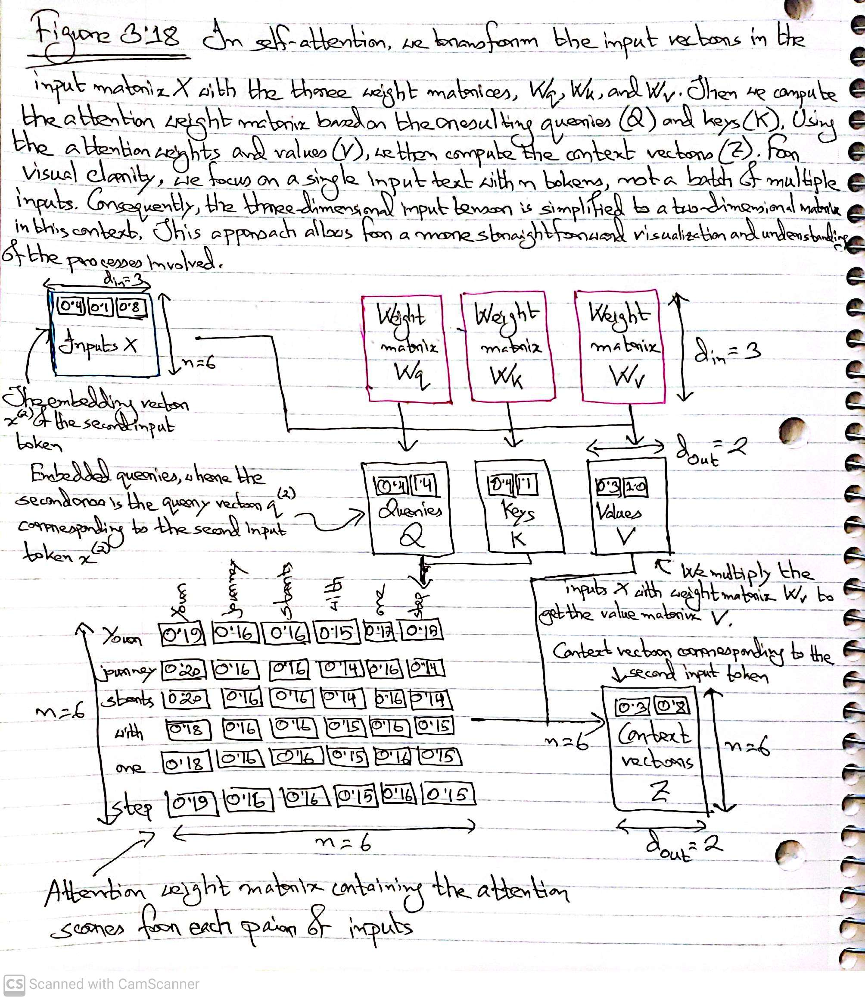

In [ ]:
display(Image(filename='3_18.jpg', width=800))

Enhancing our **SelfAttention_v1** implementation can be achieved by leveraging PyTorch’s nn.Linear layers, which serve as powerful building blocks for our model. Here’s why this approach is so beneficial:

- **Efficient Matrix Multiplication (⚡):**
`nn.Linear` layers perform matrix multiplication internally, efficiently handling the transformation of input vectors into queries, keys, and values—especially when bias units are disabled. This makes the computations both streamlined and optimized for performance.

- **Optimized Weight Initialization (🔧):**
One of the standout advantages of using nn.Linear is its built-in, optimized weight initialization scheme. Instead of manually initializing weights with `nn.Parameter(torch.rand(...))` — which might result in suboptimal or unstable starting points—the `nn.Linear` layer employs advanced initialization methods (like Xavier or Kaiming initialization). These methods are critical for:

  - **Stability during training:** Ensuring that gradients flow properly without vanishing or exploding.

  - **Faster convergence:** Helping the model learn more effectively right from the start.

- **Cleaner and More Maintainable Code (🧹):**
By using high-level abstractions like `nn.Linear`, your code becomes not only more concise but also easier to understand and maintain. It abstracts away the low-level details of weight management, letting you focus on building the overall model architecture.

In [ ]:
class SelfAttention_v2(nn.Module):
  def __init__(self, d_in, d_out, qkv_bias=False):
    super().__init__()
    self.W_query = nn.Linear(d_in, d_out, bias=qkv_bias)
    self.W_key = nn.Linear(d_in, d_out, bias=qkv_bias)
    self.W_value = nn.Linear(d_in, d_out, bias=qkv_bias)

  def forward(self, x):
    keys = self.W_key(x) # self.W_key(x) in SelfAttention_v2 is equivalent to x @ self.W_key
    queries = self.W_query(x) # equivalent to x @ self.W_query in the previous version
    values = self.W_value(x) # equivalent to x @ self.W_value in the previous version
    attn_scores = queries @ keys.T
    attn_weights = torch.softmax(attn_scores/keys.shape[-1]**0.5, dim=-1)
    context_vec = attn_weights @ values
    return context_vec

In [ ]:
torch.manual_seed(123)
sa_v2 = SelfAttention_v2(d_in, d_out)
print(sa_v2(inputs))

tensor([[-0.5337, -0.1051],
        [-0.5323, -0.1080],
        [-0.5323, -0.1079],
        [-0.5297, -0.1076],
        [-0.5311, -0.1066],
        [-0.5299, -0.1081]], grad_fn=<MmBackward0>)


## **Hiding future words with causal attention or masked attention**

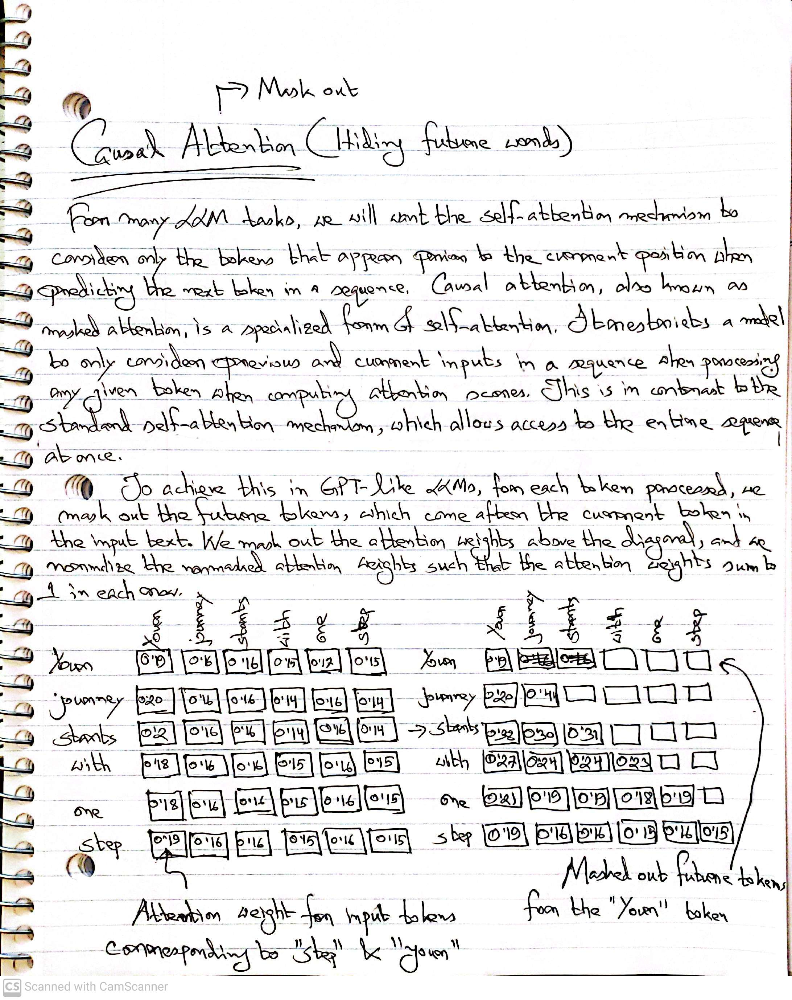

In [ ]:
display(Image(filename='causal_attention.jpg', width=800))

For many large language model (LLM) tasks, it's crucial that the self-attention mechanism only considers tokens that appear prior to the current position when predicting the next token. This is where **causal attention** (or **masked attention**) 🔒 comes into play. Unlike standard self-attention—which allows the model to access the entire input sequence at once—causal attention enforces a strict sequential order. When processing any given token, the model is restricted to using only the current and previous tokens, thereby preventing it from "peeking" into the future.

Imagine you're generating text: you wouldn’t want your model to cheat by looking ahead! Instead, for each token processed, we deliberately **mask out** all future tokens. This is achieved by applying a mask that nullifies attention scores corresponding to tokens that come after the current token in the input sequence. As illustrated in figure above 📊, this masking operation effectively zeros out the attention weights above the diagonal in the attention matrix.

Here’s what happens step by step:

- **Masking the Future Tokens:**
For every token, we set the attention weights for all tokens that follow it to a very low value (often negative infinity) so they don’t contribute during the attention computation. This ensures that only the previous and current tokens influence the prediction.

- **Normalization with Softmax:**
After applying the mask, we normalize the remaining (non-masked) attention weights using the softmax function. This guarantees that the weights in each row sum to 1, creating a proper probability distribution that tells the model how much attention to allocate to each of the previous tokens.

This careful design is essential for preserving the causality in text generation and ensuring that the model learns to generate text based solely on the context available up to that point. In our upcoming sections, we will implement this masking and normalization procedure in code, which is a critical step in building robust GPT-like models for LLM applications 🚀✨.

Usually, **the masking is done for the decoder.**
---

## Question

**But for translation, for example, from english to germany, we need to peek into future values also as word to word translation is not possible. So, my question is that for translation is self-attention correct, or does it still work?**

## Answer

In translation tasks, self-attention is indeed used, but it’s applied a bit differently compared to purely generative tasks like text generation 🚀. Here's how it works:

- **Encoder Self-Attention (Full Attention) 🔍:**
In the encoder, self-attention is applied to the entire source sentence without any masking. This allows the model to consider all tokens—including "future" tokens relative to any given position—so it can capture the full context and semantic relationships in the input language. This is crucial for translation because understanding the complete context is key to producing an accurate translation.

- **Decoder Self-Attention (Masked/Causal) 🔒:**
In the decoder, when generating the target sentence word by word, self-attention is usually masked (causal). This means the model only attends to the tokens that have already been generated. This prevents the decoder from "peeking" at future tokens in the output sequence, ensuring that the translation is generated in a sequential, autoregressive manner.

- **Cross-Attention Between Encoder and Decoder 🔄:**
To bridge the gap between the source and target languages, the decoder also employs a cross-attention mechanism. This allows the decoder to attend to the full encoder output—which, as mentioned, contains the entire context of the source sentence. Essentially, even though the decoder’s self-attention is masked, it still has full access to the complete source information through cross-attention.

### Why This Matters 🌟
- **Context is Key:**
For translation, having access to the entire source sentence is critical because word-to-word translation is rarely sufficient. The model must understand the overall context, idiomatic expressions, and grammatical structures to produce a coherent translation.

- **Different Roles for Attention:**
By using full attention in the encoder and a combination of masked self-attention and full cross-attention in the decoder, the transformer model balances the need for sequential generation (in the output) with the necessity of full contextual awareness (from the input).

- **Effective Translation:**
This dual approach enables the model to generate high-quality translations that capture the nuances of the source language while ensuring that the target language is produced in a coherent and logically consistent manner.


**Mask out the attention weights** above the diagonal to mask out the future tokens.

First, compute the attention weights using the softmax function similar to what we did before.

In [ ]:
queries = sa_v2.W_query(inputs)
keys = sa_v2.W_key(inputs)
attn_scores = queries @ keys.T
attn_weights = torch.softmax(attn_scores / keys.shape[-1]**0.5, dim=-1)
print(attn_weights)

tensor([[0.1717, 0.1762, 0.1761, 0.1555, 0.1627, 0.1579],
        [0.1636, 0.1749, 0.1746, 0.1612, 0.1605, 0.1652],
        [0.1637, 0.1749, 0.1746, 0.1611, 0.1606, 0.1651],
        [0.1636, 0.1704, 0.1702, 0.1652, 0.1632, 0.1674],
        [0.1667, 0.1722, 0.1721, 0.1618, 0.1633, 0.1639],
        [0.1624, 0.1709, 0.1706, 0.1654, 0.1625, 0.1682]],
       grad_fn=<SoftmaxBackward0>)


To create mask, we can use PyTorch's `tril` function where the values above the diagonal is zero.

In [ ]:
context_length = attn_scores.shape[0] # number of elements
mask_simple = torch.tril(torch.ones(context_length, context_length))
print(mask_simple)

tensor([[1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0.],
        [1., 1., 1., 0., 0., 0.],
        [1., 1., 1., 1., 0., 0.],
        [1., 1., 1., 1., 1., 0.],
        [1., 1., 1., 1., 1., 1.]])


In [ ]:
masked_simple = attn_weights * mask_simple
print(masked_simple)

tensor([[0.1717, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.1636, 0.1749, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.1637, 0.1749, 0.1746, 0.0000, 0.0000, 0.0000],
        [0.1636, 0.1704, 0.1702, 0.1652, 0.0000, 0.0000],
        [0.1667, 0.1722, 0.1721, 0.1618, 0.1633, 0.0000],
        [0.1624, 0.1709, 0.1706, 0.1654, 0.1625, 0.1682]],
       grad_fn=<MulBackward0>)


Now renormalize the attention weights so that they sum up to 1 again in each row.

In [ ]:
row_sums = masked_simple.sum(dim=-1, keepdims=True)
masked_simple_norm = masked_simple / row_sums
print(masked_simple_norm)

tensor([[1.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.4833, 0.5167, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.3190, 0.3408, 0.3402, 0.0000, 0.0000, 0.0000],
        [0.2445, 0.2545, 0.2542, 0.2468, 0.0000, 0.0000],
        [0.1994, 0.2060, 0.2058, 0.1935, 0.1953, 0.0000],
        [0.1624, 0.1709, 0.1706, 0.1654, 0.1625, 0.1682]],
       grad_fn=<DivBackward0>)


After masking and renormalizing, masking don't contribute to the softmax score in any meaningful way.

###### **Mathematical trick**

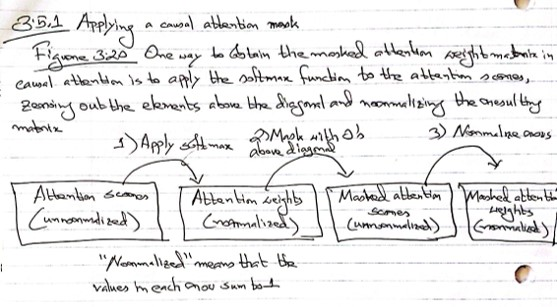

In [ ]:
display(Image(filename='Fig3.20.jpg', width=800))

Using a mathematical property of the softmax function, we can implement the computation of the masked attention weights more efficiently in fewer steps.

The softmax function is a powerful tool that transforms raw input scores into a normalized probability distribution, where each value indicates the likelihood of a particular outcome. One key characteristic of softmax is its handling of extreme values: when it encounters negative infinity (-∞), it treats these as contributing **zero probability**—since mathematically, $e^{-\infty}$ approaches 0. 🔍✨

To efficiently implement masking in our attention mechanism, we can leverage this behavior. Instead of performing complex filtering operations, we create a mask that designates positions we want to ignore—typically the "future" tokens in a causal attention setup. Here's how we do it:

1. **Create a Binary Mask:**
We generate a mask matrix with 1s above the diagonal (representing positions we want to exclude). These 1s indicate the tokens that should not influence the current token's context. 🔢 For example, in a sequence, positions corresponding to tokens that come after the current token are marked with 1s.

2. **Replace 1s with -∞:**
By substituting these 1s with negative infinity (-∞), we ensure that when the softmax function is applied, these positions yield a probability of zero. This is a clever trick that efficiently excludes unwanted contributions during attention calculation. 🔒🚫

In [ ]:
mask = torch.triu(torch.ones(context_length, context_length), diagonal=1)
print(mask)

tensor([[0., 1., 1., 1., 1., 1.],
        [0., 0., 1., 1., 1., 1.],
        [0., 0., 0., 1., 1., 1.],
        [0., 0., 0., 0., 1., 1.],
        [0., 0., 0., 0., 0., 1.],
        [0., 0., 0., 0., 0., 0.]])


In [ ]:
masked = attn_scores.masked_fill(mask.bool(), -torch.inf)
# Creates a new tensor as output, leaving the original attn_scores unchanged.
print(masked)

tensor([[0.3111,   -inf,   -inf,   -inf,   -inf,   -inf],
        [0.1655, 0.2602,   -inf,   -inf,   -inf,   -inf],
        [0.1667, 0.2602, 0.2577,   -inf,   -inf,   -inf],
        [0.0510, 0.1080, 0.1064, 0.0643,   -inf,   -inf],
        [0.1415, 0.1875, 0.1863, 0.0987, 0.1121,   -inf],
        [0.0476, 0.1192, 0.1171, 0.0731, 0.0477, 0.0966]],
       grad_fn=<MaskedFillBackward0>)


Now, apply softmax.

In [ ]:
attn_weights = torch.softmax(masked / keys.shape[-1]**0.5, dim=1)
print(attn_weights)

tensor([[1.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.4833, 0.5167, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.3190, 0.3408, 0.3402, 0.0000, 0.0000, 0.0000],
        [0.2445, 0.2545, 0.2542, 0.2468, 0.0000, 0.0000],
        [0.1994, 0.2060, 0.2058, 0.1935, 0.1953, 0.0000],
        [0.1624, 0.1709, 0.1706, 0.1654, 0.1625, 0.1682]],
       grad_fn=<SoftmaxBackward0>)


We can now use the modified attention weights to compute the context vectors via `context_vec = attn_weights @ values`. We can also use dropout to reduce overfitting.  

## **Masking additional attention weights with dropout**

Dropout in deep learning is a powerful regularization technique designed to combat overfitting by randomly deactivating a subset of hidden layer units during training. By "dropping" these units out, the model is forced to develop redundant representations, ensuring it doesn’t become overly dependent on any specific neurons. This leads to a more robust and generalizable model 🛡️✨.

It's important to note that dropout is active **only during training**. When the model is in inference or evaluation mode, dropout is disabled so that every unit contributes to the final prediction, ensuring optimal performance.

In transformer architectures—like those powering GPT models—dropout plays a critical role in the **attention mechanism**. Here, it's typically applied at two key stages:

1. **After Calculating Attention Weights (🎯):**
Once the attention scores are computed and normalized using softmax, dropout is applied to the attention weight matrix. This step prevents the model from over-relying on specific tokens by randomly deactivating some attention connections. It encourages the model to spread its focus across a broader context.

2. **After Applying Attention Weights to Value Vectors (📦):**
An alternative approach involves applying dropout after the attention weights have been used to combine the value vectors into context vectors. This further regularizes the output before it’s passed along to subsequent layers.

For our implementation, we choose to apply the dropout mask **after computing the attention weights**, as illustrated in Figure 3.22 📊. This is the more common variant in practice, as it directly regularizes the distribution of attention, helping the model learn a more balanced and distributed focus across the input sequence.

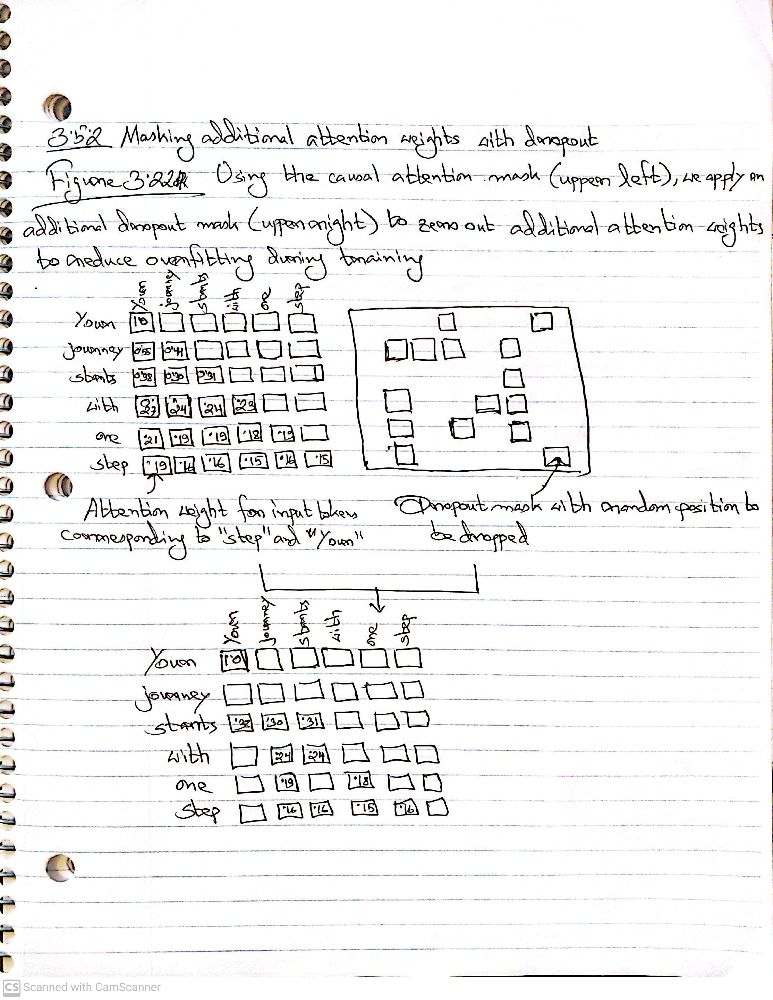

In [ ]:
display(Image(filename='Fig3.22.jpg', width=800))

Use a dropout rate of 50% or mask out half of the attention weights.

In [ ]:
torch.manual_seed(123)
dropout = torch.nn.Dropout(0.5)
example = torch.ones(6, 6)
print(dropout(example))

tensor([[2., 2., 2., 2., 2., 2.],
        [0., 2., 0., 0., 0., 0.],
        [0., 0., 2., 0., 2., 0.],
        [2., 2., 0., 0., 0., 2.],
        [2., 0., 0., 0., 0., 2.],
        [0., 2., 0., 0., 0., 0.]])


As 50% of the data is randomly set to 0, the values of the remaining elements are scaled by a factor of 1/0.5=2. This ensures that the average influence of the attention mechanism remains consistent during both the training and inference phase.

Now, let's apply dropout to the attention weight matrix.

In [ ]:
torch.manual_seed(123)
print(dropout(attn_weights))

tensor([[2.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.0000, 1.0335, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.0000, 0.0000, 0.6804, 0.0000, 0.0000, 0.0000],
        [0.4889, 0.5090, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.3988, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.0000, 0.3418, 0.0000, 0.0000, 0.0000, 0.0000]],
       grad_fn=<MulBackward0>)


### Implementing a compact causal attention class

In [ ]:
class CausalAttention(nn.Module):
  def __init__(self, d_in, d_out, context_length, dropout, qkv_bias=False):
    super().__init__()
    self.d_out = d_out
    self.W_query = nn.Linear(d_in, d_out, bias=qkv_bias)
    self.W_key = nn.Linear(d_in, d_out, bias=qkv_bias)
    self.W_value = nn.Linear(d_in, d_out, bias=qkv_bias)
    self.dropout = nn.Dropout(dropout)
    self.register_buffer('mask', torch.triu(torch.ones(context_length, context_length), diagonal=1))

  def forward(self, x):
    b, num_tokens, d_in = x.shape
    keys = self.W_key(x)
    queries = self.W_query(x)
    values = self.W_value(x)

    attn_scores = queries @ keys.transpose(1, 2) # keys.transpose(1, 2) swaps the last two dimensions (along batch axis)
    attn_scores.masked_fill_(self.mask.bool()[:num_tokens, :num_tokens], -torch.inf)
    attn_weights = torch.softmax(attn_scores / keys.shape[-1]**0.5, dim=-1)
    attn_weights = self.dropout(attn_weights)

    context_vec = attn_weights @ values
    return context_vec

1. **Understanding `self.register_buffer` and the causal mask**

```python
self.register_buffer(
    'mask',
    torch.triu(torch.ones(context_length, context_length), diagonal=1)
)
```

`self.register_buffer`: This is a PyTorch method used to save the mask as part of the model. It doesn’t count as a trainable parameter but is saved with the model. It ensures the mask stays consistent and accessible.

"The use of `register_buffer` in PyTorch is not strictly necessary for all use cases but offers several advantages here. For instance, when we use the CausalAttention class in our LLM, buffers are automatically moved to the appropriate device (CPU or GPU) along with our model, which will be relevant when training our LLM. This means we don’t need to manually ensure these tensors are on the same device as your model parameters, avoiding device mismatch errors."

```python
[[0, 1, 1, 1],
 [0, 0, 1, 1],
 [0, 0, 0, 1],
 [0, 0, 0, 0]]
```
`torch.triu`: This function creates an upper triangular matrix with ones above the diagonal and zeros elsewhere. For example, if context_length = 4, it creates:

- **Causal Mask**: This mask ensures that each token only "attends" to itself and the tokens before it. The zeros block "future" tokens (above the diagonal).
- **self.register_buffer**: This is a PyTorch method used to save the **mask** as part of the model. It doesn’t count as a trainable parameter but is saved with the model. It ensures the mask stays consistent and accessible.

The two lines:

1. **Previous version**:
```python
masked = attn_scores.masked_fill(mask.bool(), -torch.inf)
```
2. **New version**:
```python
attn_scores.masked_fill_(
    self.mask.bool()[:num_tokens, :num_tokens], -torch.inf
)

are similar in intent but differ in implementation details and efficiency. Here is the explanation on how they are synonymous and what makes them slightly different:

### **1. Similarities**

Both lines perform the same core operation:

- Replace elements in `attn_scores` where the mask is `True` with `-torch.inf`.

The result in both cases ensures that "future" tokens are effectively ignored when computing attention weights.

### **2. Differences**

#### **a) Use of `masked_fill` vs. `masked_fill_`**

- `masked_fill`:

  - Creates a new tensor as output, leaving the original attn_scores unchanged.
  - Example:
```python
masked = attn_scores.masked_fill(mask.bool(), -torch.inf)
```
    Here, masked is a new tensor, while attn_scores remains unaltered.

- `masked_fill_`:

  - Modifies the original tensor in-place, saving memory and computational overhead.
  - Example:
```python
attn_scores.masked_fill_(self.mask.bool(), -torch.inf)
```
Here, `attn_scores` is directly updated to include the mask application. There’s no need for a separate variable.

### **b) Mask Subsetting**

The new version includes:

```python
self.mask.bool()[:num_tokens, :num_tokens]
```

- This ensures that the mask's shape matches the number of tokens in the input sequence (`num_tokens`). This is particularly important for variable-length sequences, where the input may have fewer tokens than the maximum `context_length` used to define `self.mask`.

- Without subsetting (`[:num_tokens, :num_tokens]`), the mask might be larger than necessary, causing shape mismatches when applied to `attn_scores`.

### **Why the New Version is Better?**

1. Efficiency:
  - Uses `masked_fill_`, which is an in-place operation, saving memory and avoiding unnecessary tensor creation.
2. Flexibility:
  - Adapts the mask dynamically to match the input sequence length (`num_tokens`), making it suitable for variable-length inputs.

In [ ]:
inputs

tensor([[0.4300, 0.1500, 0.8900],
        [0.5500, 0.8700, 0.6600],
        [0.5700, 0.8500, 0.6400],
        [0.2200, 0.5800, 0.3300],
        [0.7700, 0.2500, 0.1000],
        [0.0500, 0.8000, 0.5500]])

In [ ]:
inputs.shape

torch.Size([6, 3])

In [ ]:
batch = torch.stack((inputs, inputs), dim=0)
print(batch.shape)

torch.Size([2, 6, 3])


In [ ]:
batch

tensor([[[0.4300, 0.1500, 0.8900],
         [0.5500, 0.8700, 0.6600],
         [0.5700, 0.8500, 0.6400],
         [0.2200, 0.5800, 0.3300],
         [0.7700, 0.2500, 0.1000],
         [0.0500, 0.8000, 0.5500]],

        [[0.4300, 0.1500, 0.8900],
         [0.5500, 0.8700, 0.6600],
         [0.5700, 0.8500, 0.6400],
         [0.2200, 0.5800, 0.3300],
         [0.7700, 0.2500, 0.1000],
         [0.0500, 0.8000, 0.5500]]])

In [ ]:
torch.manual_seed(123)
context_length = batch.shape[1]
ca = CausalAttention(d_in, d_out, context_length, 0.0)
context_vecs = ca(batch)
print("context_vecs.shape:", context_vecs.shape)

context_vecs.shape: torch.Size([2, 6, 2])


In [ ]:
context_vecs

tensor([[[-0.4519,  0.2216],
         [-0.5874,  0.0058],
         [-0.6300, -0.0632],
         [-0.5675, -0.0843],
         [-0.5526, -0.0981],
         [-0.5299, -0.1081]],

        [[-0.4519,  0.2216],
         [-0.5874,  0.0058],
         [-0.6300, -0.0632],
         [-0.5675, -0.0843],
         [-0.5526, -0.0981],
         [-0.5299, -0.1081]]], grad_fn=<UnsafeViewBackward0>)

### **Extending single-head attention to multi-head attention**

Our final step in our journey is to **extend our causal attention module into a multi-head attention** mechanism—a key component in modern transformer architectures like GPT and BERT 🤖✨. Multi-head attention allows the model to capture a richer, more diverse range of information from the input by processing it through multiple parallel "heads." Here’s a closer look:

### What Does "Multi-Head" Mean? 🌟
- **Multiple Independent Attention Heads:**
Instead of having a single set of attention weights, multi-head attention divides the mechanism into several independent modules (or "heads"). Each head processes the input independently and learns to focus on different aspects of the data. Think of it as having multiple experts, each specializing in different features of the input.

- **Parallel Processing:**
Each head computes its own set of attention scores and weights, enabling the model to simultaneously attend to various parts of the input sequence. This means the model can capture diverse relationships—such as syntactic structure, semantic meaning, or long-range dependencies—all at once.

- **Rich, Aggregated Representations:**
After each head has processed the input, their outputs are combined (usually by concatenation followed by a linear transformation). This aggregation produces a comprehensive representation that benefits from the multiple perspectives of each head.

---

### Two Approaches to Building Multi-Head Attention 🔨
1. **Intuitive Stacking:**
We can start by **stacking multiple instances of our CausalAttention module**. In this approach, each instance acts as one attention head. This method is straightforward and helps in understanding how each head contributes individually to the final context representation.

2. **Optimized Implementation:**
Once the intuition is clear, we can implement multi-head attention in a more computationally efficient way. This optimized version leverages advanced matrix operations to process all attention heads simultaneously, reducing computational overhead while maintaining the benefits of multi-head diversity.

By moving from single-head (causal attention) to **multi-head attention**, we empower our model to extract and combine a broader range of insights from the input data. This leads to better performance in tasks like language modeling, translation, and beyond.

#### **3.6.1 Stacking multiple single-head attention layers**

Practically, In practical terms, multiple instances of the self-attention mechanism are created, each with its own weights, for implementing multi-head attention. Then the outputs are combined.

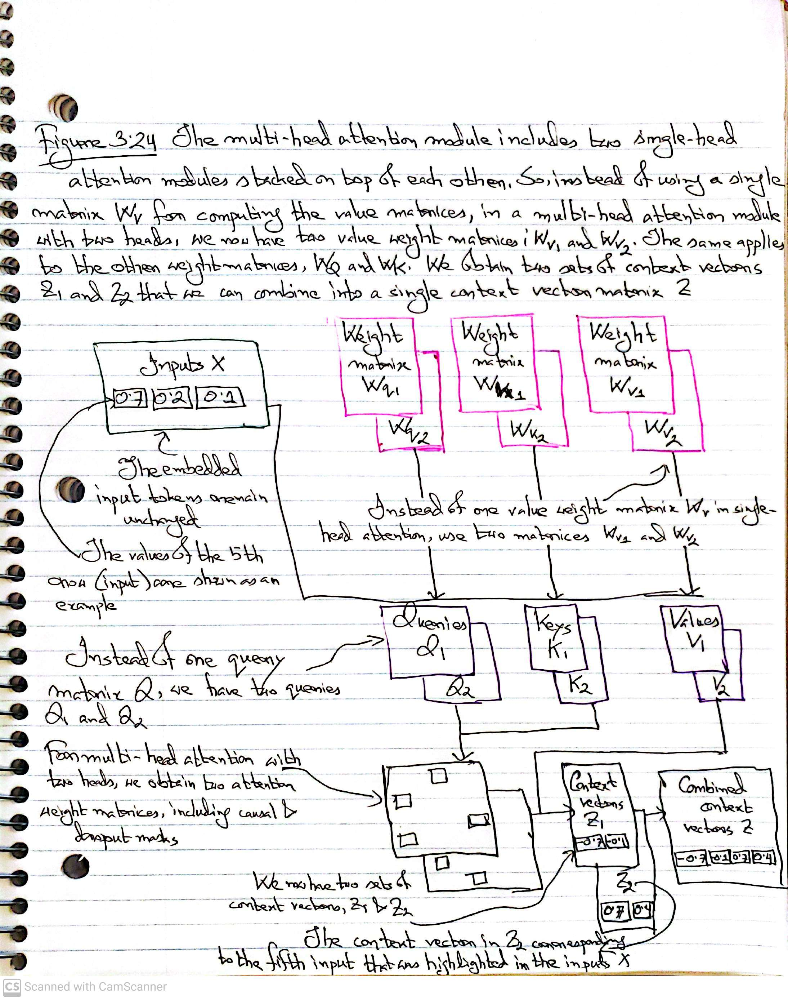

In [ ]:
display(Image(filename='Fig3.24.jpg', width=800))

In [ ]:
class MultiHeadAttentionWrapper(nn.Module):
  def __init__(self, d_in, d_out, context_length, dropout, num_heads, qkv_bias=False):
    super().__init__()
    self.heads = nn.ModuleList(
        [CausalAttention(d_in, d_out, context_length, dropout, qkv_bias) for _ in range(num_heads)]
    )

  def forward(self, x):
    return torch.cat([head(x) for head in self.heads], dim=-1)

In [ ]:
batch.shape

torch.Size([2, 6, 3])

In [ ]:
batch

tensor([[[0.4300, 0.1500, 0.8900],
         [0.5500, 0.8700, 0.6600],
         [0.5700, 0.8500, 0.6400],
         [0.2200, 0.5800, 0.3300],
         [0.7700, 0.2500, 0.1000],
         [0.0500, 0.8000, 0.5500]],

        [[0.4300, 0.1500, 0.8900],
         [0.5500, 0.8700, 0.6600],
         [0.5700, 0.8500, 0.6400],
         [0.2200, 0.5800, 0.3300],
         [0.7700, 0.2500, 0.1000],
         [0.0500, 0.8000, 0.5500]]])

In [ ]:
torch.manual_seed(123)
context_length = batch.shape[1]
d_in, d_out = 3, 2
mha = MultiHeadAttentionWrapper(d_in, d_out, context_length, 0.0, num_heads=2)
context_vecs = mha(batch)
print(context_vecs)
print("context_vecs.shape:", context_vecs.shape)

tensor([[[-0.4519,  0.2216,  0.4772,  0.1063],
         [-0.5874,  0.0058,  0.5891,  0.3257],
         [-0.6300, -0.0632,  0.6202,  0.3860],
         [-0.5675, -0.0843,  0.5478,  0.3589],
         [-0.5526, -0.0981,  0.5321,  0.3428],
         [-0.5299, -0.1081,  0.5077,  0.3493]],

        [[-0.4519,  0.2216,  0.4772,  0.1063],
         [-0.5874,  0.0058,  0.5891,  0.3257],
         [-0.6300, -0.0632,  0.6202,  0.3860],
         [-0.5675, -0.0843,  0.5478,  0.3589],
         [-0.5526, -0.0981,  0.5321,  0.3428],
         [-0.5299, -0.1081,  0.5077,  0.3493]]], grad_fn=<CatBackward0>)
context_vecs.shape: torch.Size([2, 6, 4])


Here we have two attention heads (`num_heads = 2`) and output dimension is 2 (`d_out = 2`), so the cotext vector is 4-dimensional (d_out * num_heads = 4).

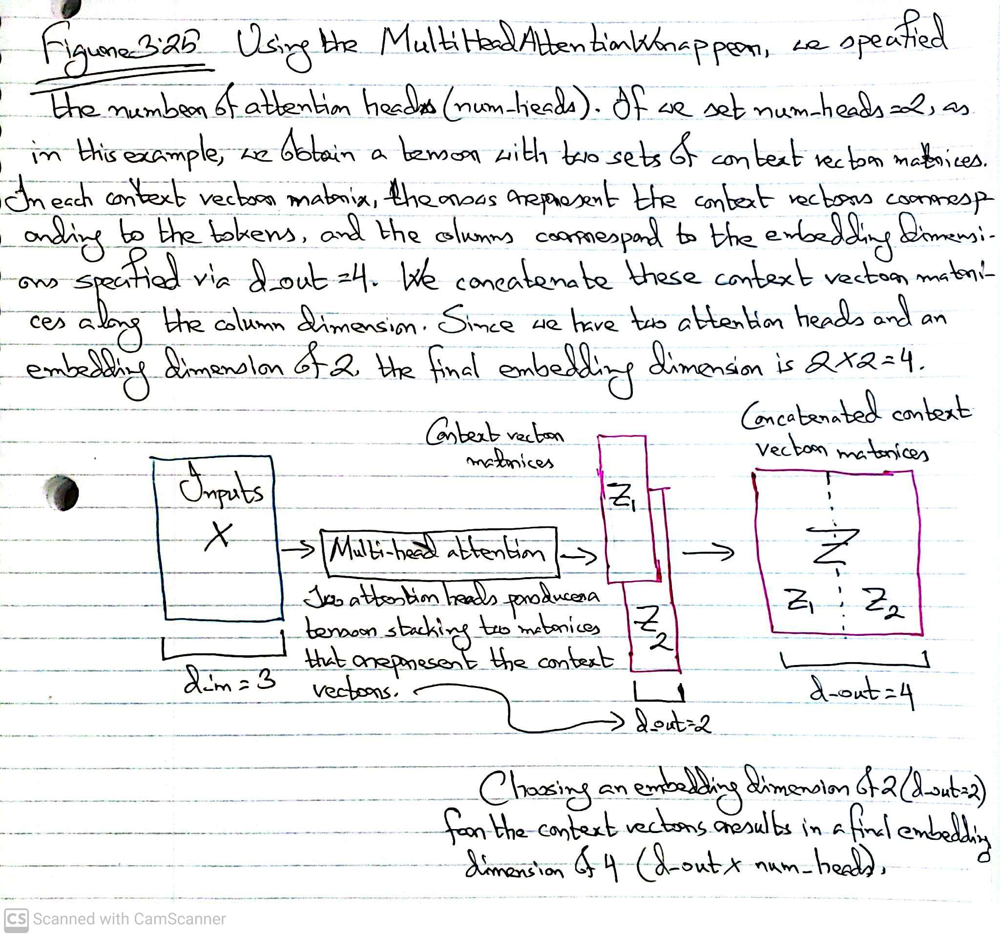

In [ ]:
display(Image(filename='3_25.jpg', width=800))

Up to this point, we've built a **MultiHeadAttentionWrapper** that combines multiple single-head attention modules to capture diverse features from the input. Initially, these heads were processed **sequentially** using a list comprehension like `[head(x) for head in self.heads]` in the forward method. While this approach works, it processes each attention head one after the other, which can be a bottleneck, especially as the number of heads grows.

### 💡 Why Process in Parallel?
Processing the heads in parallel can significantly improve efficiency by leveraging modern hardware accelerators (like GPUs) that are optimized for matrix operations. Instead of computing each head's output one by one, we can use **matrix multiplication** to compute the outputs for all attention heads simultaneously. This not only speeds up the computation but also simplifies the implementation by taking advantage of optimized linear algebra routines.

### 🔄 The Parallel Approach:

- **Matrix Multiplication:**
By reshaping the inputs and combining the weight matrices for all heads, we can perform one big matrix multiplication that outputs all attention heads at once.

- **Efficiency & Scalability:**
This method reduces the sequential dependency in the computation, making the attention mechanism more scalable and performant.

In [ ]:
d_in, d_out = 3, 2
mha = MultiHeadAttentionWrapper(d_in, d_out, context_length, 0.0, num_heads=1)
context_vecs = mha(batch)
print(context_vecs)
print("context_vecs.shape:", context_vecs.shape)

tensor([[[0.4566, 0.2729],
         [0.5792, 0.3011],
         [0.6249, 0.3102],
         [0.5691, 0.2785],
         [0.5543, 0.2520],
         [0.5337, 0.2499]],

        [[0.4566, 0.2729],
         [0.5792, 0.3011],
         [0.6249, 0.3102],
         [0.5691, 0.2785],
         [0.5543, 0.2520],
         [0.5337, 0.2499]]], grad_fn=<CatBackward0>)
context_vecs.shape: torch.Size([2, 6, 2])


###  Implementing multi-head attention with weight splits -- Synonymous to the combination of the above two classes

So far, we've built a **MultiHeadAttentionWrapper** that implements multi-head attention by stacking multiple single-head attention modules. In our initial approach, we instantiated and combined several **CausalAttention** objects, each acting as an independent attention head. This allowed us to capture diverse aspects of the input by processing each head separately and then concatenating their outputs. 🚀

However, rather than maintaining two separate classes — **MultiHeadAttentionWrapper** and **CausalAttention** — we can streamline our architecture by merging these concepts into a single, unified **MultiHeadAttention** class. This new class not only simplifies the codebase but also introduces several modifications to enhance the efficiency of multi-head attention. 🔄✨

### What’s Changing? 🔍
- **Unified Structure:**
The new **MultiHeadAttention** class integrates multi-head functionality within one class. Instead of creating a list of separate CausalAttention objects (i.e., self.heads), the class now **splits the input into multiple heads** by reshaping the projected query, key, and value tensors. This approach leverages matrix operations to process all heads in parallel, which is both elegant and computationally efficient. 💡

- **Efficient Tensor Operations:**
By reshaping the query, key, and value tensors, the new class computes attention for all heads simultaneously. After processing, the outputs from these heads are combined (typically concatenated and passed through another linear layer) to form a unified representation. This design not only reduces computational overhead but also makes the code more scalable for large models. 📊

- **Simpler Maintenance:**
Merging the two classes into one helps in reducing code redundancy and simplifies debugging and further enhancements. This is particularly valuable as models grow in complexity, ensuring that each component remains easy to understand and optimize. 🛠️

### In Summary 📚
- **Old Approach:**

  - **MultiHeadAttentionWrapper:** Combined multiple single-head (CausalAttention) modules using a list of objects.

  - **CausalAttention:** Each instance independently performed the attention mechanism, and results were concatenated.

- **New Unified Approach:**

  - **MultiHeadAttention:** A single class that splits input tensors into multiple heads by reshaping, computes attention for all heads in parallel, and then combines the outputs.

  - **Efficiency Gains:** Fewer classes, optimized computations, and easier maintenance make this approach more suitable for scaling up to larger, more complex transformer models.

In [ ]:
import torch
import torch.nn as nn

class MultiHeadAttention(nn.Module):
    def __init__(self, d_in, d_out, context_length, dropout, num_heads, qkv_bias=False):
        super().__init__()
        # Ensure that d_out is divisible by num_heads so each head has equal dimensions
        assert (d_out % num_heads == 0), "d_out must be divisible by num_heads"

        self.d_out = d_out  # Output dimensionality (total for all heads combined)
        self.num_heads = num_heads  # Number of attention heads
        self.head_dim = d_out // num_heads  # Dimensionality of each head

        # Linear layers to project input into queries, keys, and values
        self.W_query = nn.Linear(d_in, d_out, bias=qkv_bias)  # Project input to query space
        self.W_key = nn.Linear(d_in, d_out, bias=qkv_bias)    # Project input to key space
        self.W_value = nn.Linear(d_in, d_out, bias=qkv_bias)  # Project input to value space

        # Final linear layer to combine the results of all heads
        self.out_proj = nn.Linear(d_out, d_out)

        # Dropout layer for regularization to prevent overfitting
        self.dropout = nn.Dropout(dropout)

        # Upper triangular mask to prevent attention to future tokens (causality)
        # Shape: (context_length, context_length)
        self.register_buffer(
            "mask",
            torch.triu(torch.ones(context_length, context_length), diagonal=1)
        )

    def forward(self, x):
        """
        x: Input tensor of shape (batch_size, num_tokens, d_in)
        """
        b, num_tokens, d_in = x.shape  # Extract batch size, number of tokens, and input dimensions

        # Project input x into queries, keys, and values
        keys = self.W_key(x)        # Shape: (batch_size, num_tokens, d_out)
        queries = self.W_query(x)  # Shape: (batch_size, num_tokens, d_out)
        values = self.W_value(x)   # Shape: (batch_size, num_tokens, d_out)

        # Split d_out into num_heads and head_dim for multi-head attention
        # Reshape keys, values, and queries to include a num_heads dimension
        keys = keys.view(b, num_tokens, self.num_heads, self.head_dim)       # Shape: (batch_size, num_tokens, num_heads, head_dim)
        values = values.view(b, num_tokens, self.num_heads, self.head_dim)   # Shape: (batch_size, num_tokens, num_heads, head_dim)
        queries = queries.view(b, num_tokens, self.num_heads, self.head_dim) # Shape: (batch_size, num_tokens, num_heads, head_dim)

        # Transpose num_tokens and num_heads for easier computation across heads
        keys = keys.transpose(1, 2)       # Shape: (batch_size, num_heads, num_tokens, head_dim)
        queries = queries.transpose(1, 2) # Shape: (batch_size, num_heads, num_tokens, head_dim)
        values = values.transpose(1, 2)   # Shape: (batch_size, num_heads, num_tokens, head_dim)

        # Compute scaled dot-product attention scores
        # Multiplying queries with keys (transposed) along head_dim
        attn_scores = queries @ keys.transpose(2, 3)  # Shape: (batch_size, num_heads, num_tokens, head_dim) @ (batch_size, num_heads, head_dim, num_tokens) = (batch_size, num_heads, num_tokens, num_tokens)

        # Apply the causality mask to prevent attention to future tokens
        mask_bool = self.mask.bool()[:num_tokens, :num_tokens]  # Mask for current sequence length
        attn_scores.masked_fill_(mask_bool, -torch.inf)  # Set masked positions to negative infinity

        # Normalize attention scores using softmax along the last dimension (num_tokens)
        attn_weights = torch.softmax(attn_scores / keys.shape[-1]**0.5, dim=-1)  # Shape: (batch_size, num_heads, num_tokens, num_tokens)

        # Apply dropout for regularization
        attn_weights = self.dropout(attn_weights)

        # Compute context vectors by multiplying attention weights with values
        context_vec = (attn_weights @ values)  # Shape: (batch_size, num_heads, num_tokens, head_dim)

        # Transpose back to original layout to combine the heads
        context_vec = context_vec.transpose(1, 2)  # Shape: (batch_size, num_tokens, num_heads, head_dim)

        # Flatten the multi-head output by merging num_heads and head_dim
        context_vec = context_vec.contiguous().view(b, num_tokens, self.d_out)  # Shape: (batch_size, num_tokens, d_out)

        # Final linear layer to combine information across heads
        context_vec = self.out_proj(context_vec)  # Shape: (batch_size, num_tokens, d_out)

        return context_vec


In [ ]:
a = torch.tensor([[[[0.2745, 0.6584, 0.2775, 0.8573],
                    [0.8993, 0.0390, 0.9268, 0.7388],
                    [0.7179, 0.7058, 0.9156, 0.4340]],

                   [[0.0772, 0.3565, 0.1479, 0.5331],
                    [0.4066, 0.2318, 0.4545, 0.9737],
                    [0.4606, 0.5159, 0.4220, 0.5786]]]])

In [ ]:
a.shape

torch.Size([1, 2, 3, 4])

In [ ]:
print(a @ a.transpose(2, 3))

tensor([[[[1.3208, 1.1631, 1.2879],
          [1.1631, 2.2150, 1.8424],
          [1.2879, 1.8424, 2.0402]],

         [[0.4391, 0.7003, 0.5903],
          [0.7003, 1.3737, 1.0620],
          [0.5903, 1.0620, 0.9912]]]])


In [ ]:
torch.manual_seed(123)
batch_size, context_length, d_in = batch.shape
d_out = 2
mha = MultiHeadAttention(d_in, d_out, context_length, 0.0, num_heads= 2)
context_vecs = mha(batch)
print(context_vecs)
print("context_vecs.shape:", context_vecs.shape)

tensor([[[0.3190, 0.4858],
         [0.2943, 0.3897],
         [0.2856, 0.3593],
         [0.2693, 0.3873],
         [0.2639, 0.3928],
         [0.2575, 0.4028]],

        [[0.3190, 0.4858],
         [0.2943, 0.3897],
         [0.2856, 0.3593],
         [0.2693, 0.3873],
         [0.2639, 0.3928],
         [0.2575, 0.4028]]], grad_fn=<ViewBackward0>)
context_vecs.shape: torch.Size([2, 6, 2])


### **Given**:
- d_out = 2 (the total output dimension after multi-head attention)

- num_heads = 2 (number of attention heads)

### **What is head_dim?**
In multi-head attention, the total output dimension (d_out) is split equally among all heads.

So each head gets:

- head_dim = d_out // num_heads = 2 / 2 = 1

### **What does head_dim = 1 mean?**

- Each attention head will work on vectors of size 1.

- So when you split your projected queries, keys, and values, each head will have vectors of length 1 for each token.

- This is valid — it just means each head is working on a 1-dimensional subspace of the total embedding.

### **Is it okay to have head_dim = 1?**

- Yes, it’s allowed.

- Usually, models use larger dimensions per head (like 64 or 32) to have richer representations, but for testing or small models, head_dim = 1 can be fine.

- The important thing is that d_out must be divisible by num_heads, which you ensured with the assertion in your code.

### **To summarize:**

- Your total output dimension is 2.

- You have 2 heads.

- So each head gets a 1-dimensional vector (head_dim = 1).

- The attention is computed separately for each head on these 1D vectors, then the outputs from all heads are concatenated back together to form a vector of size 2.

Let's break this down step by step.

1. First, let's understand what remained the same:


  - Both implementations have query, key, and value linear projections

  - Both use the same causal mask

  - Both compute attention scores and weights similarly

  - Both apply dropout


2. Key Differences in Architecture:

```python
# Old approach (two classes):
MultiHeadAttentionWrapper
   └── Multiple CausalAttention objects (one per head)
       └── Each head processes full input independently

# New approach (single class):
MultiHeadAttention
   └── Single set of QKV projections
       └── Splits output into heads through reshaping
```

3. Let's understand the forward pass transformations with an example:

```python
# Assume:
b (batch_size) = 2
num_tokens = 4
d_in = 512
d_out = 256
num_heads = 8
head_dim = d_out // num_heads = 32

# Input shape: (2, 4, 512)
x = ...
b, num_tokens, d_in = x.shape
b = 2
num_tokens = 4
d_in = 512

# After linear projections:
keys = self.W_key(x)      # Shape: (2, 4, 256)
queries = self.W_query(x) # Shape: (2, 4, 256)
values = self.W_value(x)  # Shape: (2, 4, 256)

# After view operation:
# .view(b, num_tokens, self.num_heads, self.head_dim)
keys = keys.view(2, 4, 8, 32)    # Reshape to separate heads
queries = queries.view(2, 4, 8, 32)
values = values.view(2, 4, 8, 32)

# After transpose(1, 2):
# This brings the heads dimension before sequence length
keys = keys.transpose(1, 2)      # Shape: (2, 8, 4, 32)
queries = queries.transpose(1, 2) # Shape: (2, 8, 4, 32)
values = values.transpose(1, 2)   # Shape: (2, 8, 4, 32)

# Attention scores:
# queries @ keys.transpose(2, 3)
# Shape: (2, 8, 4, 32) @ (2, 8, 32, 4) = (2, 8, 4, 4)
attn_scores = queries @ keys.transpose(2, 3)

# After softmax and dropout:
attn_weights = torch.softmax(attn_scores / scale, dim=-1)  # Shape: (2, 8, 4, 4)

# Context vector calculation:
# (attn_weights @ values).transpose(1, 2)
# Shape: (2, 8, 4, 4) @ (2, 8, 4, 32) = (2, 8, 4, 32)
# After transpose: (2, 4, 8, 32)
context_vec = (attn_weights @ values).transpose(1, 2)

# Final reshaping:
# .contiguous() ensures memory layout is optimal for the view operation
# context_vec = context_vec.contiguous().view(b, num_tokens, self.d_out)
context_vec = context_vec.contiguous().view(2, 4, 256)  # Combine all heads
```

The key difference is that the new implementation:

1. Projects the input once (instead of once per head)
2. Splits the projections into heads using reshaping
3. Processes all heads in parallel through matrix operations
4. Combines heads at the end using reshaping

This is more efficient because:

- It requires fewer parameter matrices (one set instead of num_heads sets)
- It can leverage parallel processing of all heads
- Memory usage is more efficient
- Matrix operations can be optimized better by the hardware

The `contiguous()` call is needed because `transpose` operations can make the tensor's memory layout non-contiguous, which can cause issues with the subsequent view operation. `contiguous()` ensures the memory layout is appropriate for reshaping.

#### **Purpose of self.out_proj**
The purpose of self.out_proj is to mix information across all attention heads after their outputs have been concatenated.

#### **Why do we need this?**
- After computing multi-head attention, the outputs from all attention heads are concatenated into a single tensor of shape:

```python
(batch_size, num_tokens, d_out)
```
where `d_out = num_heads * head_dim`.

- While the attention heads capture different aspects of the input data, the concatenated output needs to be transformed into a final representation for further use in the model (e.g., in transformers, it’s passed to the feed-forward network).

- The `out_proj` layer:

  1. Reduces redundancy: Combines the contributions of all heads into a more meaningful representation.
  2. Adds learnable parameters: Helps the model learn how to best utilize the information from all heads.

#### **What Happens in self.out_proj?**
The `context_vec` tensor, which has the shape:

```python
(batch_size, num_tokens, d_out)
```
is passed through the linear layer:

```python
context_vec = self.out_proj(context_vec)
```
This means:

1. For each token in each sequence, the d_out features are linearly transformed.
2. Each output vector is computed as:

```python
output = context_vec @ W_out^T + b_out
```
where:
  - `W_out` and `b_out` are the weight matrix and bias of the `out_proj` layer.
  - The weights W_out have shape `(d_out, d_out)`.

##### **Resulting Tensor**
The shape of `context_vec` remains the same after this operation:

```python
(batch_size, num_tokens, d_out)
```
However, its values are now transformed and adjusted, combining information across all attention heads.